# Análisis de señal EEG, detección del potencial evocado P300 y ataque basado en ruido
## Ingeniería Informática en la Universidad de Murcia - Trabajo Fin de Grado
### Desarrollado por Enrique Tomás Martínez Beltrán

https://github.com/enriquetomasmb/bci-tfg

## Importamos los paquetes necesarios

In [1]:
import sys
import os
import warnings
# sys.path.insert(0, os.path.join(sys.path[0], "utils"))
import mne
from mne import Epochs, find_events, pick_events
from collections import OrderedDict
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from datetime import datetime
import numpy as np
from scipy import signal

from analysis_tools import load_raw, plot_conditions, convert_openbci, convert_new_openbci, apply_nontarget



In [2]:
sampling_rate = 255

#dataset = "data/raw_4_54.csv"
#dataset = "records/record_17-06-2020-13-20-57.csv"
#dataset = "records/record_17-06-2020-16-36-57.csv"
#dataset = "data/data.csv"

dataset = "data/input/last_exp.csv"
convert_raw_openbci_to_csv = True

subject = 0
session = 0
ch_names = {}

In [3]:
if convert_raw_openbci_to_csv:
    dataset = convert_new_openbci(dataset)

Fichero data\converted_last_exp.csv ya convertido
Recuperando fichero...


#### Se carga el fichero directamente si se emplea el script automático del repositorio

In [4]:
# dataset = apply_nontarget('converted_last_exp.csv')
dataset = "data/full_converted_last_exp.csv"

## Cargamos el daset y formamos el Raw Data

#### Representación del csv (obtenida mediante el lanzador de experimento del repositorio)
- Time
- Timestamp
- Canales (8 canales): Fp1, Fp2, C3, C4, P7, P8, O1, O2
- Estimulo Stream

In [6]:
# El siguiente comando para la representación:
# No contamos indice de ch la columna de "timestamps"
raw = load_raw(dataset, sfreq=sampling_rate, stim_ind=8, replace_ch_names=None, ch_ind=[0, 1, 2, 3, 4, 5, 6, 7])
#raw = load_raw(dataset, sfreq=sampling_rate, stim_ind=5, replace_ch_names=None, ch_ind=[0, 1, 2, 3]) # data.csv

print(raw)

Creating RawArray with float64 data, n_channels=9, n_times=45265
    Range : 0 ... 45264 =      0.000 ...   177.506 secs
Ready.
<RawArray | 9 x 45265 (177.5 s), ~3.1 MB, data loaded>


## Información del Raw

In [7]:
print('Frecuencia de muestreo:', raw.info['sfreq'], 'Hz')
print('Tamaño de la matriz de datos: {}\n'.format(raw.get_data().shape))

print(raw.info)

Sample rate del Raw: 255.0 Hz
Tamaño de la matriz de datos: (9, 45265)

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, C3, C4, P7, P8, O1, O2, Stim
 chs: 8 EEG, 1 STIM
 custom_ref_applied: False
 dig: 11 items (3 Cardinal, 8 EEG)
 highpass: 0.0 Hz
 lowpass: 127.5 Hz
 meas_date: unspecified
 nchan: 9
 projs: []
 sfreq: 255.0 Hz
>


## Análisis utilizando numpy (y no mne)

In [8]:
# fs_Hz = 250.0

# new_data = {}

# for channel in raw.ch_names:
#     print("* Procesando canal " + channel)
#     data_ch = raw.get_data(picks=channel)
    
#     # Removes OpenBCI DC offset
#     # EEG.remove_dc_offset()
#     hp_cutoff_Hz = 1.0
#     print("Highpass filtering at: " + str(hp_cutoff_Hz) + " Hz")
#     b, a = signal.butter(2, hp_cutoff_Hz/(fs_Hz / 2.0), 'highpass')
#     new_data[channel] = signal.lfilter(b, a, data_ch, 0)
    
#     #########
#     iir_params = dict(order=2, ftype='butter')
    
#     # low high
#     raw_high = raw.copy().filter(None, 0.008, method='iir', iir_params=iir_params)
#     aux = raw_high.get_data(picks=channel)
#     print(aux)
#     ######################
    
#     # Notches 60hz noise (if you're in Europe, switch to 50Hz)
#     # EEG.notch_mains_interference()
#     notch_freq_Hz = np.array([50.0])  # main + harmonic frequencies
#     for freq_Hz in np.nditer(notch_freq_Hz):  # loop over each target freq
#         bp_stop_Hz = freq_Hz + 3.0*np.array([-1, 1])  # set the stop band
#         b, a = signal.butter(3, bp_stop_Hz/(fs_Hz / 2.0), 'bandstop')
#         new_data[channel] = signal.lfilter(b, a, data_ch, 0)
#         print("Notch filter removing: " + str(bp_stop_Hz[0]) + "-" + str(bp_stop_Hz[1]) + " Hz")


#     raw_notch = raw.copy().notch_filter(np.array([50.0]), iir_params=iir_params, filter_length='auto',phase='zero')
#     aux = raw_notch.get_data(picks=channel)
#     print(aux)
    
    # Make signal plot
    # EEG.signalplot()
#     print("Generating signal plot...")
#     plt.figure(figsize=(10,5))
#     plt.subplot(1,1,1)
#     plt.plot(self.t_sec,self.data)
#     plt.xlabel('Time (sec)')
#     plt.ylabel('Power (uV)')
#     plt.title(self.plot_title('Signal'))
#     self.plotit(plt)

# # Crunches spectrum data and stores as EEGrunt attribute(s) for reuse
# EEG.get_spectrum_data()

# # Returns bandpassed data
# # (uses scipy.signal butterworth filter)
# start_Hz = 1
# stop_Hz = 50
# EEG.data = EEG.bandpass(start_Hz,stop_Hz)

# # Make Spectrogram
# EEG.spectrogram()









# # Line graph of amplitude over time for a given frequency range.
# # Arguments are start frequency, end frequency, and label
# EEG.plot_band_power(8,12,"Alpha")

# # Power spectrum
# EEG.plot_spectrum_avg_fft()



# # Plots
    
    
    

## Filtramos solo por los canales O1 y O2
## También consideramos el canal de estímulos STIM

In [9]:
# raw = raw.pick_channels(['O1', 'O2', 'Stim'])

## Guardamos los nombres de canales

In [10]:
for i, chn in enumerate(raw.ch_names):
    ch_names[chn] = i

print(ch_names)

{'Fp1': 0, 'Fp2': 1, 'C3': 2, 'C4': 3, 'P7': 4, 'P8': 5, 'O1': 6, 'O2': 7, 'Stim': 8}


## Ploteamos el raw

Effective window size : 8.031 (s)


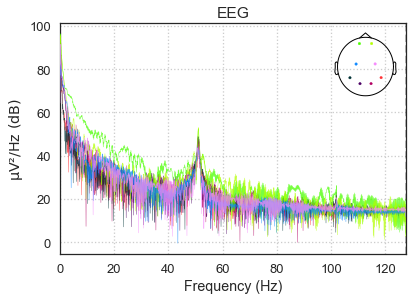

Effective window size : 8.031 (s)


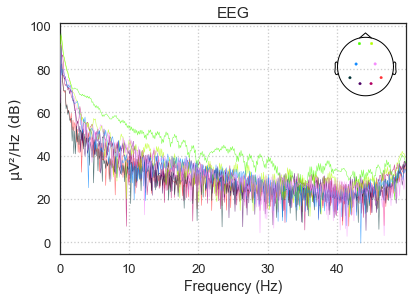

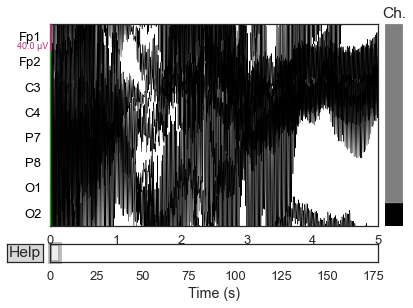

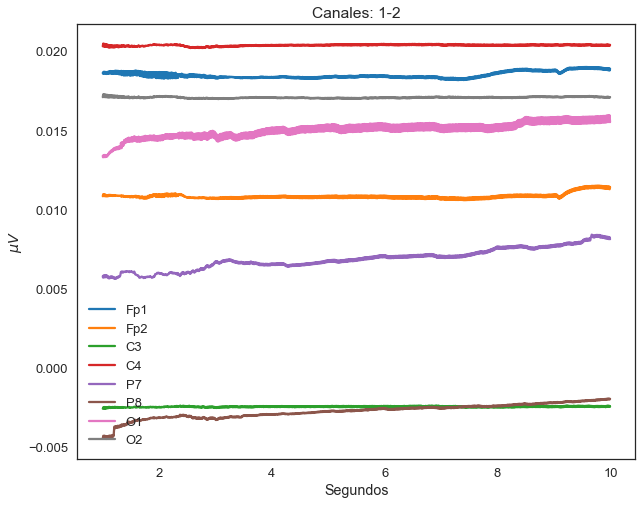

In [11]:
raw.plot_psd()
#raw.plot_psd(fmin=1, fmax=30)
raw.plot_psd(fmax=50)
raw.plot(duration=5, n_channels=8)

channels_to_plot = 2;
sfreq = raw.info['sfreq']
data_ini, times_ini = raw[:-1, int(sfreq * 1):int(sfreq * 10)]

fig = plt.subplots(figsize=(10, 8))
plt.plot(times_ini, data_ini.T);
plt.xlabel('Segundos')
plt.ylabel('$\mu V$')
plt.title('Canales: 1-2');
plt.legend(raw.ch_names[:-1]);

## Downsampling a la señal

In [12]:
# print('Sampling Rate old:', raw.info['sfreq'], 'Hz')


# # Plot a piece of data to see the effects of downsampling
# plt.figure(figsize=(20, 3))

# n_samples_to_plot = int(0.5 * raw.info['sfreq'])  # plot 0.5 seconds of data
# data, times = raw[1, :n_samples_to_plot]
# plt.plot(times,data.T, color='black')


# # Downsampling
# raw.resample(50, npad="auto")
# print('Sampling Rate new:', raw.info['sfreq'], 'Hz')

# n_samples_to_plot = int(0.5 * raw.info['sfreq'])  # plot 0.5 seconds of data
# data, times = raw[1, :n_samples_to_plot]
# plt.plot(times,data.T,'-o', color='red')

# plt.xlabel('time (s)')
# plt.legend(['original', 'downsampled'], loc='best')
# plt.title('Efecto de downsampling en el canal O2 (2)')


In [13]:
# data, times = raw[:channels_to_plot, int(sfreq * 1):int(sfreq * 10)]

# fig = plt.subplots(figsize=(10, 8))
# plt.plot(times, data.T);
# plt.xlabel('Seconds')
# plt.ylabel('$\mu V$')
# plt.title('Channels: 1-2');
# plt.legend(raw.ch_names[:channels_to_plot]);

# Notch filter

Removing power-line noise with notch filtering¶


Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 1683 samples (6.600 sec)

Effective window size : 8.031 (s)


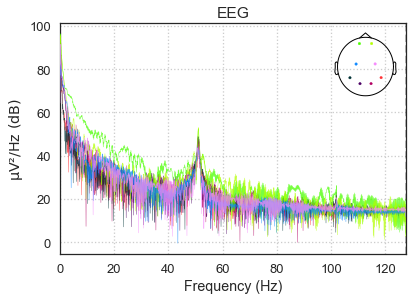

Effective window size : 8.031 (s)


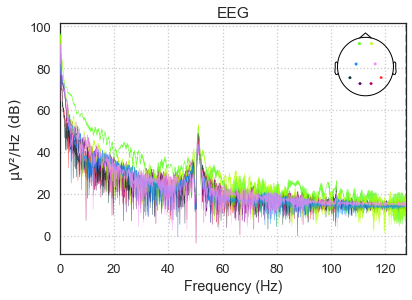

Effective window size : 8.031 (s)
Effective window size : 8.031 (s)


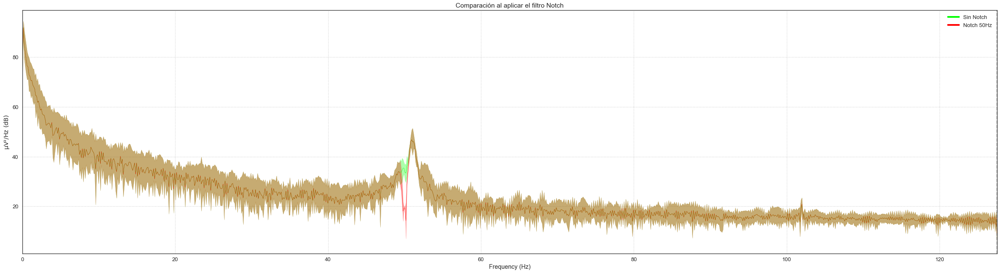

In [14]:
# Utilizo [50,100] en vez de np.arange(50, 100, 50) --> el primero incluye los casos necesarios y el arange solo el "50"
raw_notch = raw.copy().notch_filter([50.0])
raw.plot_psd()
raw_notch.plot_psd()
 
    
custom_lines = [Line2D([0], [0], color=(0, 1, 0), lw=4),
                Line2D([0], [0], color=(1, 0, 0), lw=4)]

fig, ax = plt.subplots(figsize = (40, 10))
raw.plot_psd(ax=ax, color=(0, 1, 0), average=True, show=False)
raw_notch.plot_psd(ax=ax, color=(1, 0, 0), average=True, show=False)
ax.set_title('Comparación al aplicar el filtro Notch')
plt.legend(custom_lines, ['Sin Notch', 'Notch 50Hz'])


## Otro orden, no hay gran diferencia --> uso justo el de arriba, además con IIR hay que hacerlo individualmente por cada frecuencia que consideramos.
# iir_params = dict(order=2, ftype='butter')
# raw_notch_2 = raw.copy().notch_filter([50], method='iir', iir_params=iir_params, filter_length='auto',phase='zero')
# raw_notch_2 = raw_notch_2.notch_filter([100], method='iir', iir_params=iir_params, filter_length='auto',phase='zero')


# fig, ax = plt.subplots(figsize = (40, 10))
# raw.plot_psd(ax=ax, color=(0, 1, 0), average=True, show=False)
# raw_notch_2.plot_psd(ax=ax, color=(1, 0, 0), average=True, show=False)
# ax.set_title('Comparación al aplicar el filtro Notch')
# plt.legend(custom_lines, ['Sin Notch', 'Notch 50Hz'])


# Aplico bandpass más adelante
# raw2 = raw_notch.filter(1., None, fir_design='firwin')
# raw2.plot_psd()


## Aplicamos bandpass

https://www.researchgate.net/post/What_type_of_filter_is_best_suitable_for_filtering_EEG_data

FIR FILTER
- raw_filter = raw.copy().filter(.2, 20., fir_design='firwin', skip_by_annotation='edge')
- raw_filter = raw.copy().filter(.8, 20., fir_design='firwin', skip_by_annotation='edge')

IIR FILTER
- raw_filter = raw.copy().filter(0.01, 20., method='iir')


## Diferentes filtros pasobanda
### Con [1Hz, 17Hz] se ve francamante bien el P300
- https://hal.inria.fr/hal-00756669/document
- https://mne.tools/stable/generated/mne.io.Raw.html#mne.io.Raw.filter (para ver cuál es lower y upper en IIR)

Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 10 Hz

IIR filter parameters
---------------------
Butterworth lowpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 8 (effective, after forward-backward)
- Cutoff at 10.00 Hz: -6.02 dB

Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 15 Hz

IIR filter parameters
---------------------
Butterworth lowpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 8 (effective, after forward-backward)
- Cutoff at 15.00 Hz: -6.02 dB

Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 17 Hz

IIR filter parameters
---------------------
Butterworth lowpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 8 (effective, after forward-backward)
- Cutoff at 17.00 Hz: -6.02 dB

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 10 Hz

IIR filter parameters
-------------------

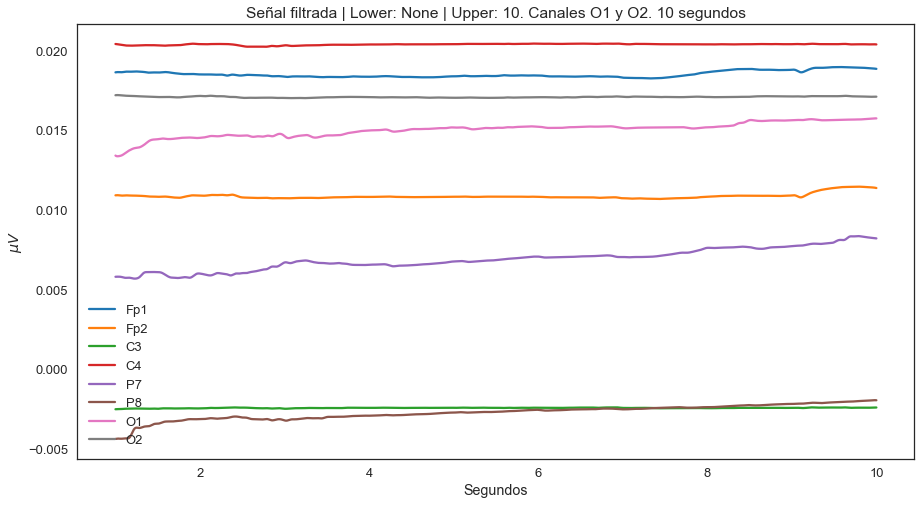

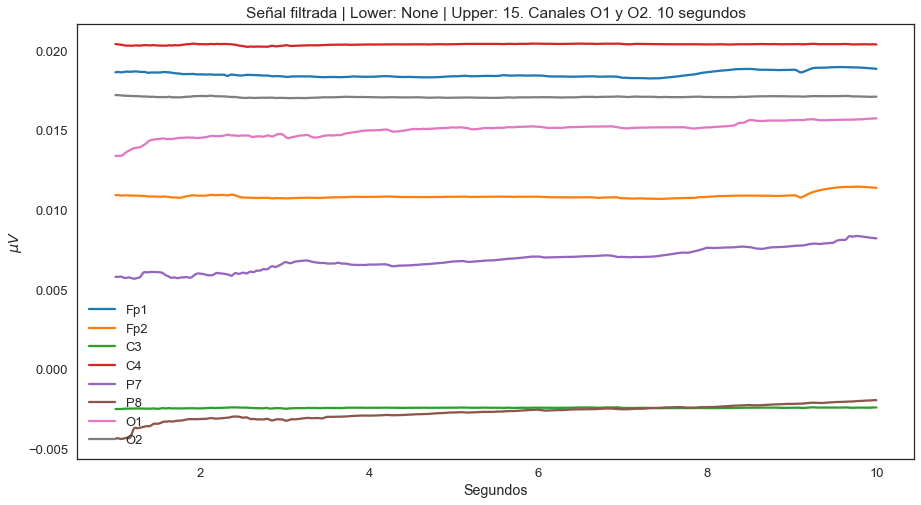

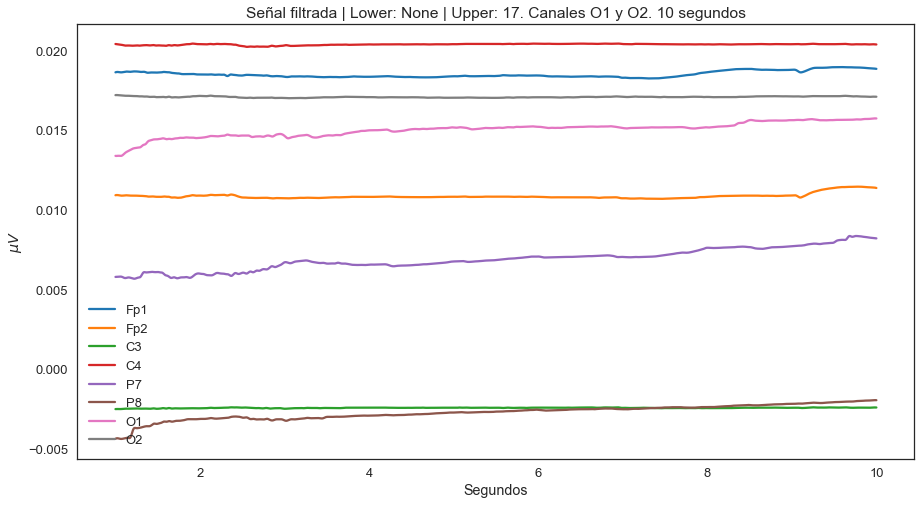

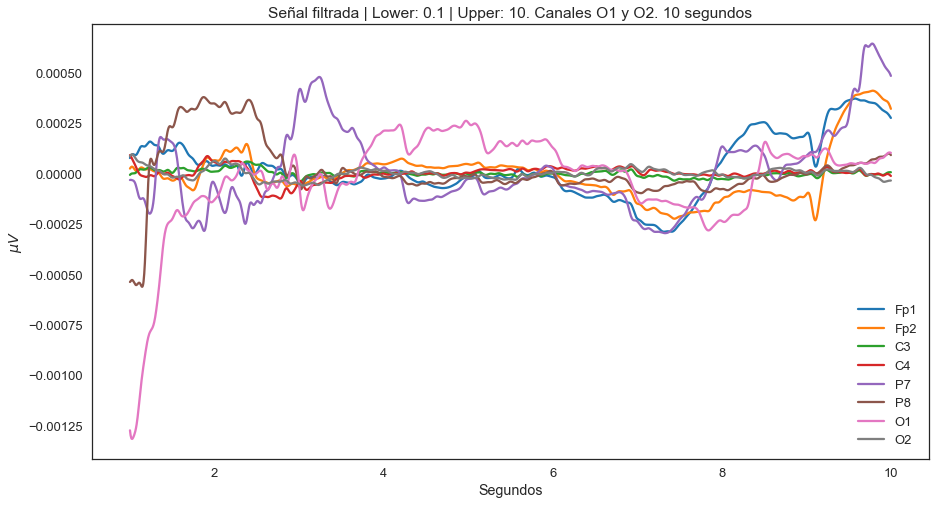

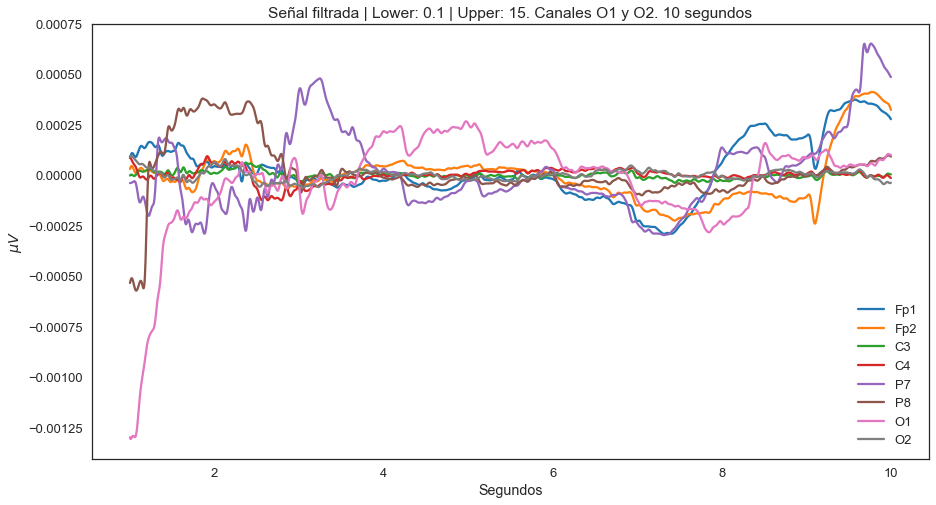

...

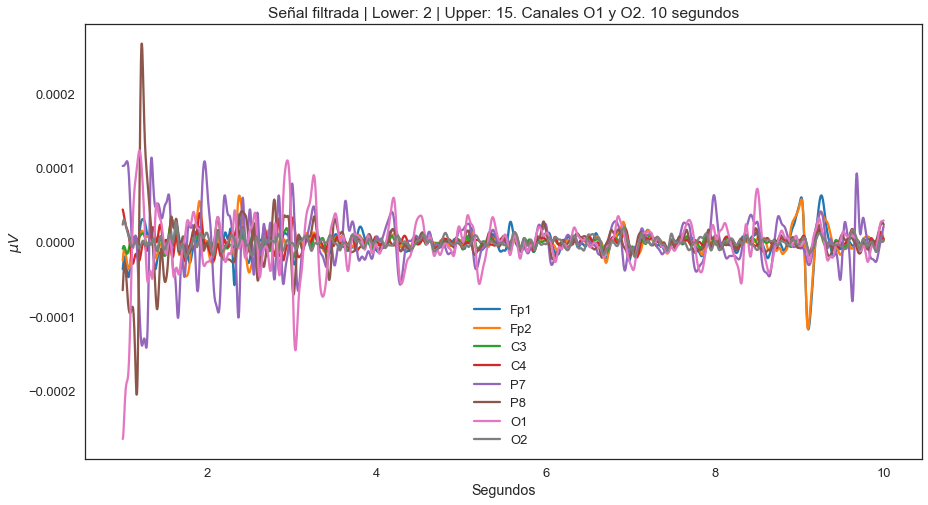

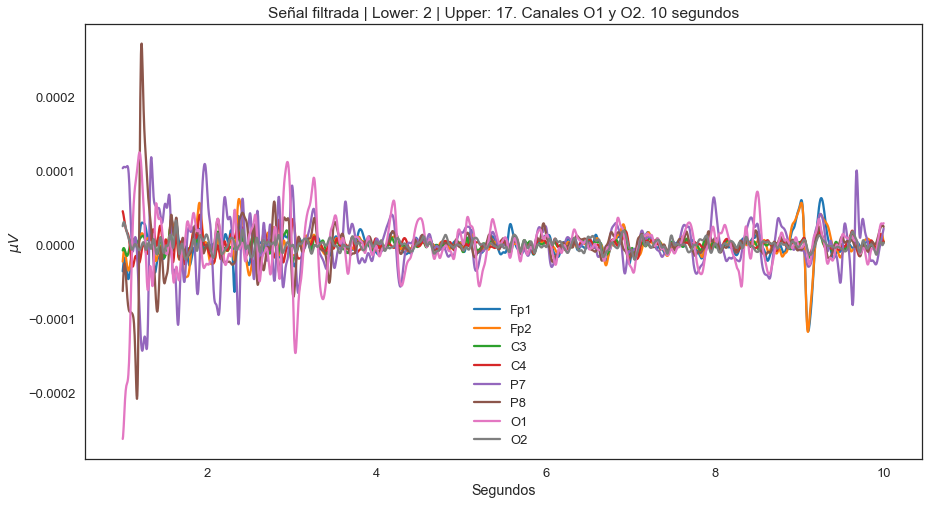

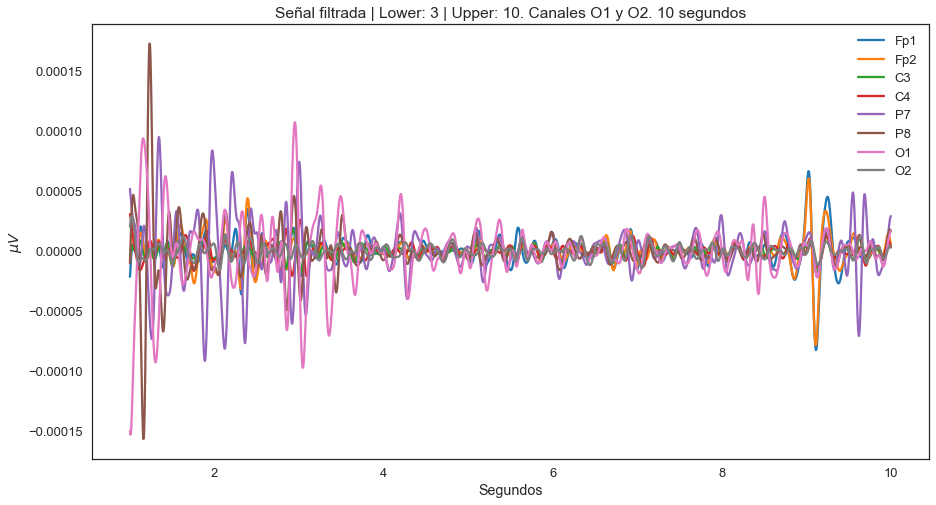

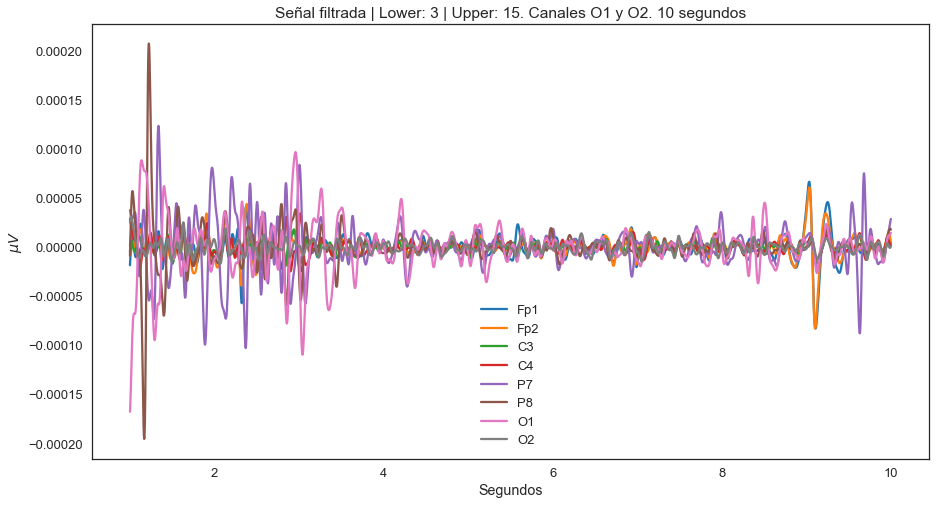

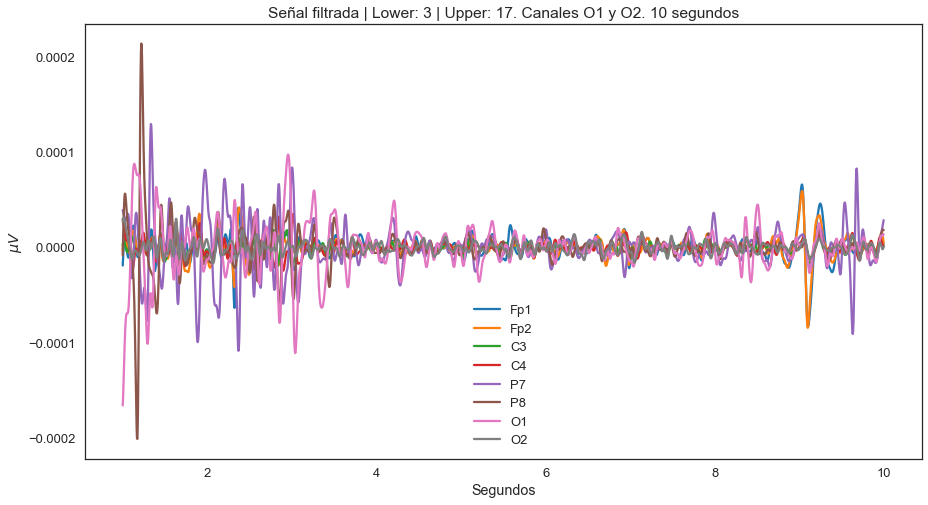

In [15]:
for lower in [None, 0.1, 1, 2, 3]:
    for upper in [10, 15, 17]:
        rawaux = raw_notch.copy().filter(lower, upper, method='iir')
        data_f, times_f = rawaux[:-1, int(sfreq * 1):int(sfreq * 10)]
        fig = plt.subplots(figsize=(15, 8))
        plt.plot(times_f, data_f.T);
        plt.xlabel('Segundos')
        plt.ylabel('$\mu V$')
        plt.title('Señal filtrada | Lower: {} | Upper: {}. Canales O1 y O2. 10 segundos'.format(lower, upper));
        plt.legend(rawaux.ch_names[:-1]);

        

In [16]:
raw_notch_and_filter = raw_notch.copy().filter(1, 17, method='iir')

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 17 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 1.00, 17.00 Hz: -6.02, -6.02 dB



## Visualización de la señal filtrada

Effective window size : 8.031 (s)


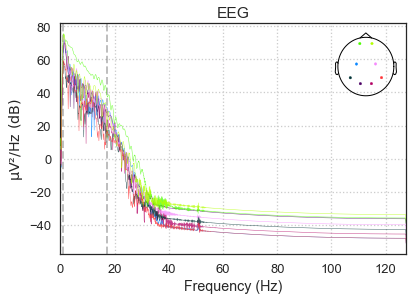

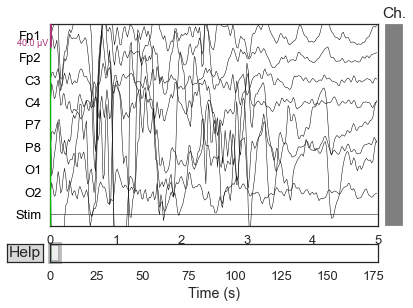

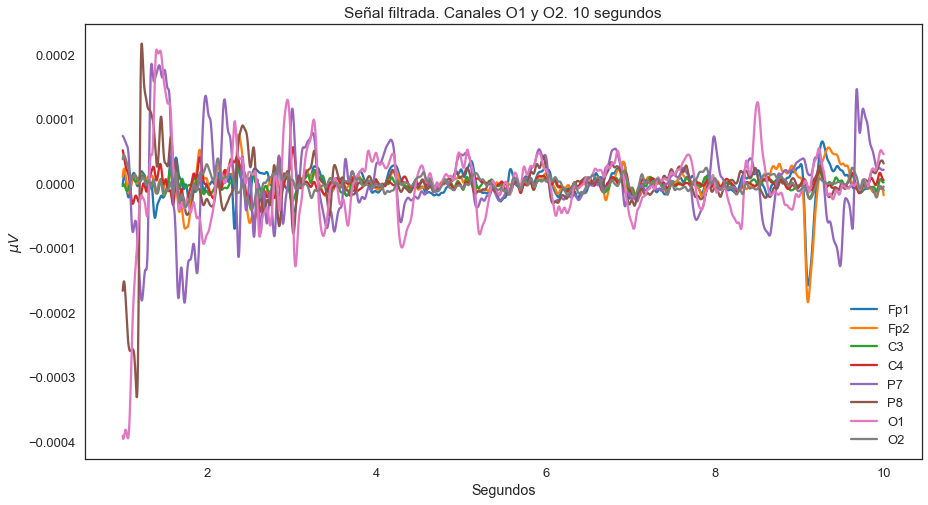

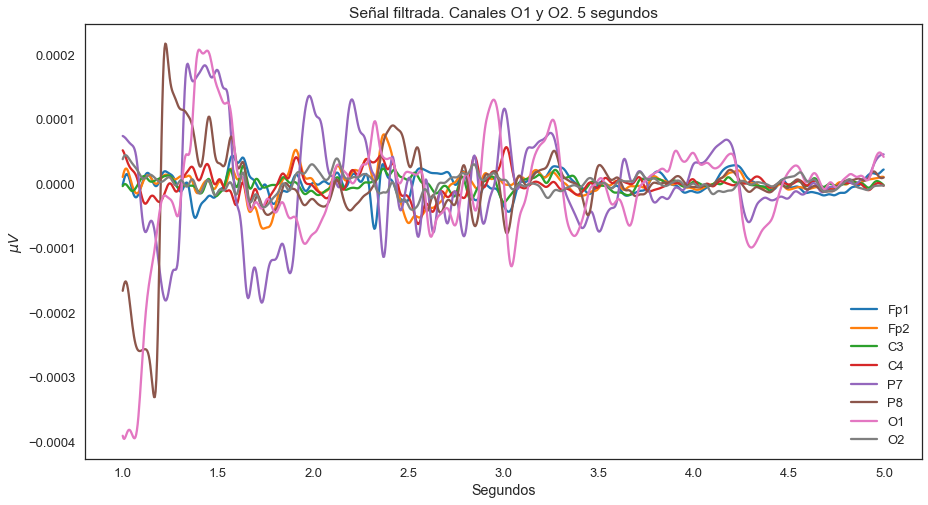

In [17]:
raw_notch_and_filter.plot_psd()
raw_notch_and_filter.plot(duration=5)
data_f, times_f = raw_notch_and_filter[:-1, int(sfreq * 1):int(sfreq * 10)]
fig = plt.subplots(figsize=(15, 8))
plt.plot(times_f, data_f.T);
plt.xlabel('Segundos')
plt.ylabel('$\mu V$')
plt.title('Señal filtrada. Canales O1 y O2. 10 segundos');
plt.legend(raw_notch_and_filter.ch_names[:-1]);


# 1 segundo
data_f_1, times_f_1 = raw_notch_and_filter[:-1, int(sfreq * 1):int(sfreq * 5)]
fig = plt.subplots(figsize=(15, 8))
plt.plot(times_f_1, data_f_1.T);
plt.xlabel('Segundos')
plt.ylabel('$\mu V$')
plt.title('Señal filtrada. Canales O1 y O2. 5 segundos');
plt.legend(raw_notch_and_filter.ch_names[:-1]);

## Comparativa raw inicial con raw_notch_and_filter 8 (no filtrada vs filtrada)

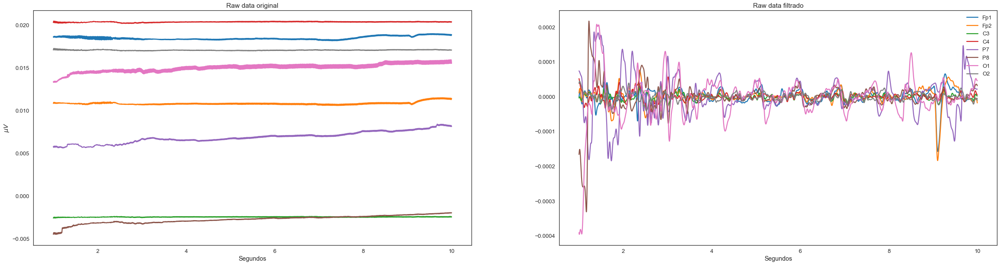

In [18]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize = (40, 10))

ax1.plot(times_ini, data_ini.T);
ax1.set_title('Raw data original')
ax1.set_xlabel('Segundos')
ax1.set_ylabel('$\mu V$')

ax2.plot(times_f, data_f.T);
ax2.set_title('Raw data filtrado')
ax2.set_xlabel('Segundos')

plt.legend(raw.ch_names[:8], loc=1);
# plt.tight_layout()


## Same anterior pero solo con canales O1 y O2

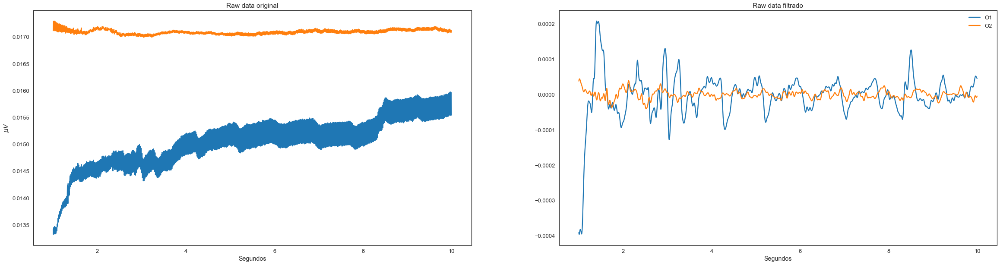

In [19]:
data_ini_occipital, times_ini_occipital = raw[-3:-1, int(sfreq * 1):int(sfreq * 10)]

data_f_occipital, times_f_occipital = raw_notch_and_filter[-3:-1, int(sfreq * 1):int(sfreq * 10)]

fig, (ax1, ax2) = plt.subplots(1,2, figsize = (40, 10))

ax1.plot(times_ini_occipital, data_ini_occipital.T);
ax1.set_title('Raw data original')
ax1.set_xlabel('Segundos')
ax1.set_ylabel('$\mu V$')

ax2.plot(times_f_occipital, data_f_occipital.T);
ax2.set_title('Raw data filtrado')
ax2.set_xlabel('Segundos')

plt.legend(raw.ch_names[-3:-1], loc=1);

## Downsampling análisis

Frecuencia de muestreo (OLD):  255.0 Hz
111 events found
Event IDs: [1 2]
111 events found
Event IDs: [1 2]
Frecuencia de muestreo (NEW):  50.0 Hz


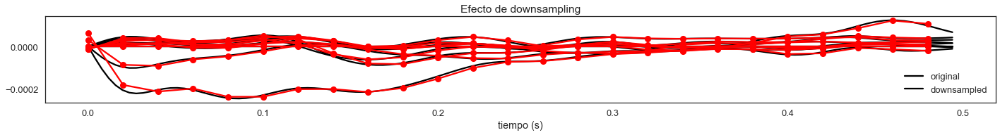

In [20]:
print('Frecuencia de muestreo (OLD): ', raw_notch_and_filter.info['sfreq'], 'Hz')


# Plot a piece of data to see the effects of downsampling
plt.figure(figsize=(20, 3))

n_samples_to_plot = int(0.5 * raw_notch_and_filter.info['sfreq'])  # plot 0.5 seconds of data
data, times = raw_notch_and_filter[:, :n_samples_to_plot]
plt.plot(times,data.T, color='black')


# Downsampling
raw_notch_and_filter_downsamp = raw_notch_and_filter.copy()
raw_notch_and_filter_downsamp.resample(50, npad="auto")
print('Frecuencia de muestreo (NEW): ', raw_notch_and_filter_downsamp.info['sfreq'], 'Hz')

n_samples_to_plot = int(0.5 * raw_notch_and_filter_downsamp.info['sfreq'])  # plot 0.5 seconds of data
data, times = raw_notch_and_filter_downsamp[:, :n_samples_to_plot]
plt.plot(times,data.T,'-o', color='red')

plt.xlabel('tiempo (s)')
plt.legend(['original', 'downsampled'], loc='best')
plt.title('Efecto de downsampling')
mne.viz.tight_layout()




### Según el análisis:
- No es buena idea reducir el muestreo de la señal, los datos pueden llegar a ser confusos u opuestos a los reales (como muestra la imagen inferior)

## Preprocesamiento ICA

In [21]:
# # set up and fit the ICA
# # Buscar ejemplo para ver ICA usado
# ica = mne.preprocessing.ICA(random_state=97, max_iter=800)
# ica.fit(raw_notch_and_filter)
# ica.exclude = [0,1]  # details on how we picked these are omitted here
# ica.plot_properties(raw_notch_and_filter, picks=ica.exclude)

- Aplicamos ICA y comparamos

In [22]:
# raw_notch_and_filter_ica = raw_notch_and_filter.copy()
# raw_notch_and_filter_ica.load_data()
# ica.apply(raw_notch_and_filter_ica)

# raw_notch_and_filter.plot(start=12, duration=4)
# raw_notch_and_filter_ica.plot(start=12, duration=4)


## High pass a la señal

In [23]:
# # High pass filtering below 50 Hz
# raw_high = raw.copy().filter(.1, None, fir_design='firwin')
# data, times = raw_high[:channels_to_plot, int(sfreq * 1):int(sfreq * 10)]

# fig = plt.subplots(figsize=(10, 8))
# plt.plot(times, data.T);
# plt.xlabel('Seconds')
# plt.ylabel('$\mu V$')
# plt.title('Channels: 1-2');
# plt.legend(raw_high.ch_names[:channels_to_plot]);

## Low y High pass filter

In [24]:
# raw_filter = raw.copy()
# raw_filter.filter(.1, None, fir_design='firwin')
# raw_filter.filter(None, 12., fir_design='firwin')
# data, times = raw_filter[:channels_to_plot, int(sfreq * 1):int(sfreq * 10)]

# fig = plt.subplots(figsize=(10, 8))
# plt.plot(times, data.T);
# plt.xlabel('Seconds')
# plt.ylabel('$\mu V$')
# plt.title('Channels: 1-2');
# plt.legend(raw_filter.ch_names[:channels_to_plot]);

## Obtenemos eventos producidos

In [25]:
events = find_events(raw_notch_and_filter_downsamp, shortest_event=1) #
print('Found %s events, first five:' % len(events))
print(events[:5])

111 events found
Event IDs: [1 2]
Found 111 events, first five:
[[3792    0    2]
 [3816    0    2]
 [3841    0    2]
 [3865    0    2]
 [3890    0    2]]


## Creamos la clase Epochs con los eventos obtenidos, los events_id y el rawdata

Una época o "epoch" hace referencia a una traza de posible P300.

Básicamente parte de los eventos encontrados y componen traza con -0.1 segundos antes del evento y 0.8 después del evento.

En este caso, solo hay un evento, es decir el rawdata se compone de una parte del experimento donde sabemos exactamente el timestamp y lo hemos añadido. Por lo que es cogido por el script.

Sería interesante:
- Lanzar LSL python y experimento en pantalla al mismo tiempo.
- Script de lanzamiento del experimento, guarda timestamp de la imagen.
- Una vez completado el experimento: nos vamos al fichero csv, miramos primera columna con los timestamp, añadimos un "1" en la columna de Marker para que en el análisis sea detectado el evento.
- Nos quedará un conjunto de épocas bastante interesante que podremos analizar aquí.

## Definimos baseline y lo aplicamos a la clase Epochs

In [26]:
baseline = (None, 0)

In [27]:
event_id = {'Target': 1, 'NoTarget': 2}
reject = {'eeg': 100e-6}


epochs = Epochs(raw_notch_and_filter_downsamp, events=events, event_id=event_id, tmin=-0.1, tmax=0.8, reject=reject, baseline=None, preload=True)
print(epochs)
# 'add_eeg_ref' False
epochs.pick_types(eeg=True)


111 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 111 events and 46 original time points ...
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['P7']
    Rejecting  epoch based on EEG : ['P7']
    Rejecting  epoch based on EEG : ['P7']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['P7']
    Rejecting  epoch based on EEG : ['P7']
    Rejecting  epoch based on EEG : ['P7']
    Rejecting  epoch based on EEG : ['P7']
    Rejecting  epoch based on EEG : ['P7']
    Rejecting  epoch based on EEG : ['O1']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2', 'O1']
17 bad epochs dropped
<Epochs  |   94 events (all goo

<Epochs  |   94 events (all good), -0.1 - 0.8 sec, baseline off, ~298 kB, data loaded,
 'NoTarget': 89
 'Target': 5>

## % de épocas rechazadas

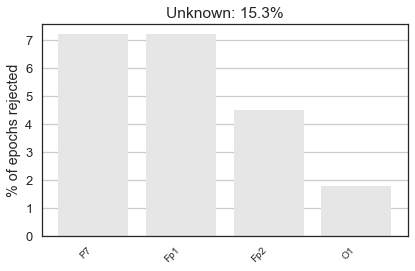

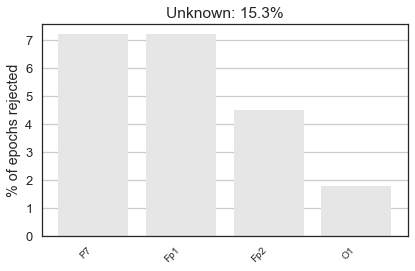

In [28]:
epochs.plot_drop_log()

################################ Estímulo #14 ################################


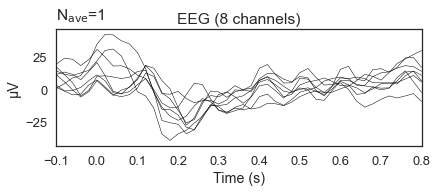

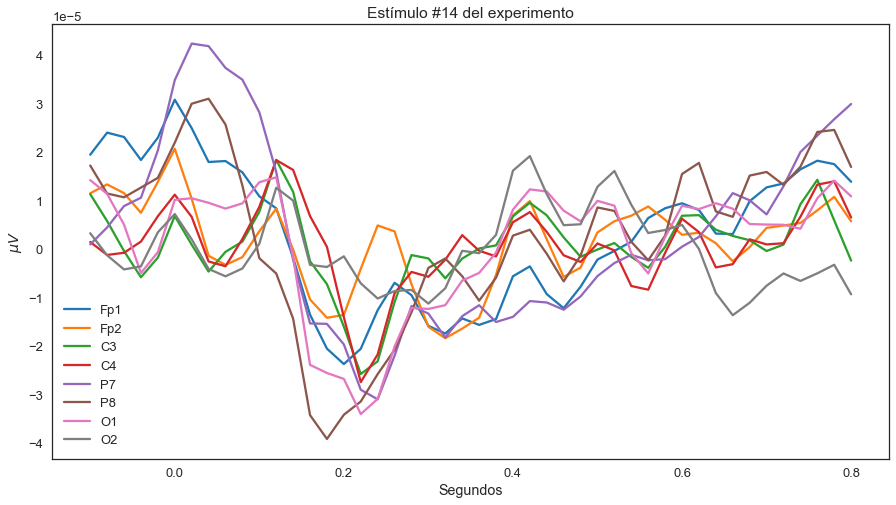

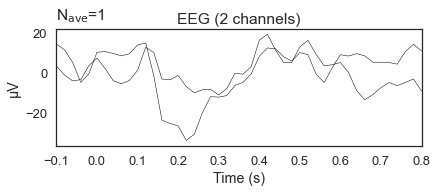

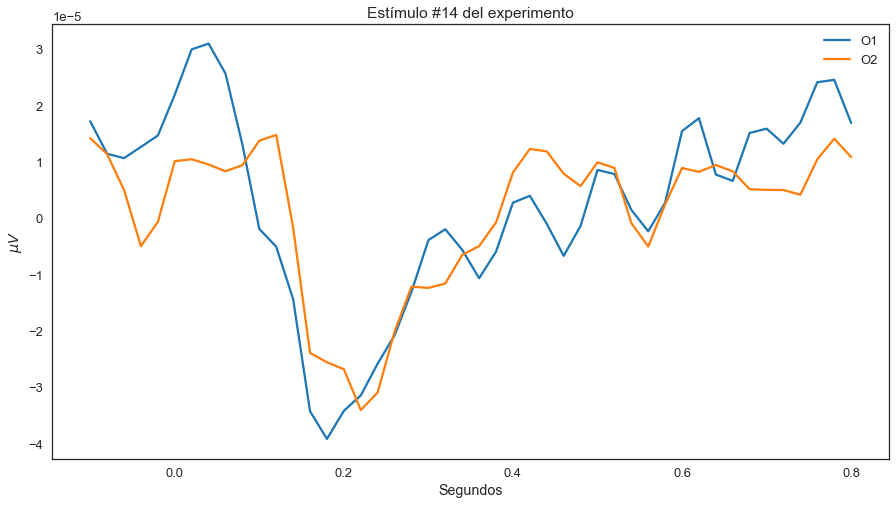

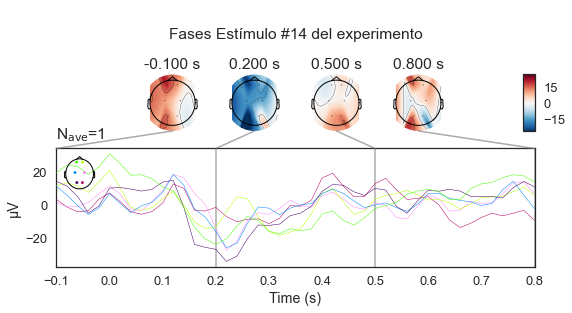

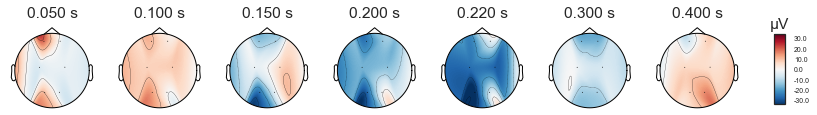

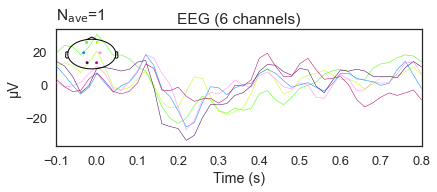

################################ Estímulo #32 ################################


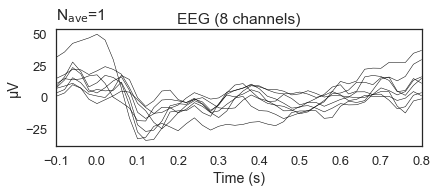

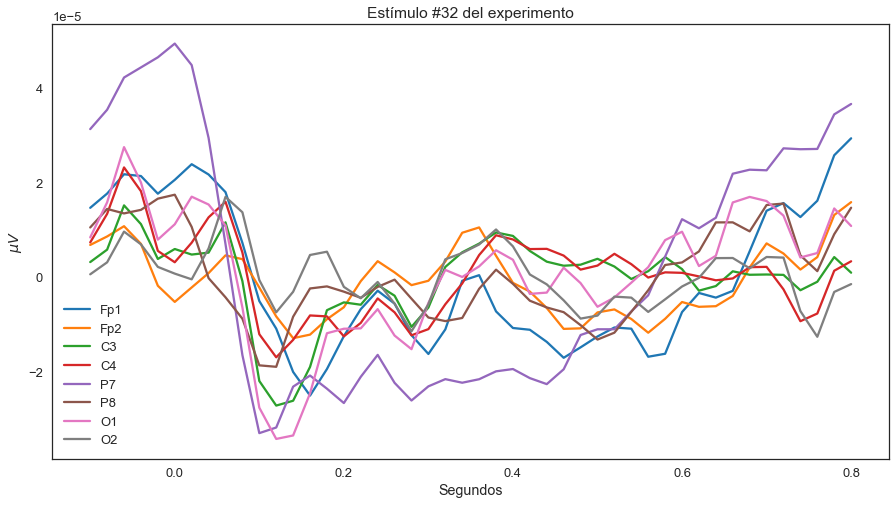

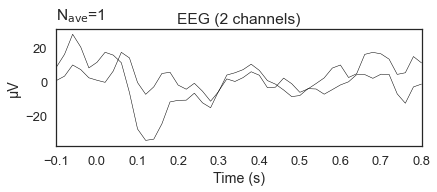

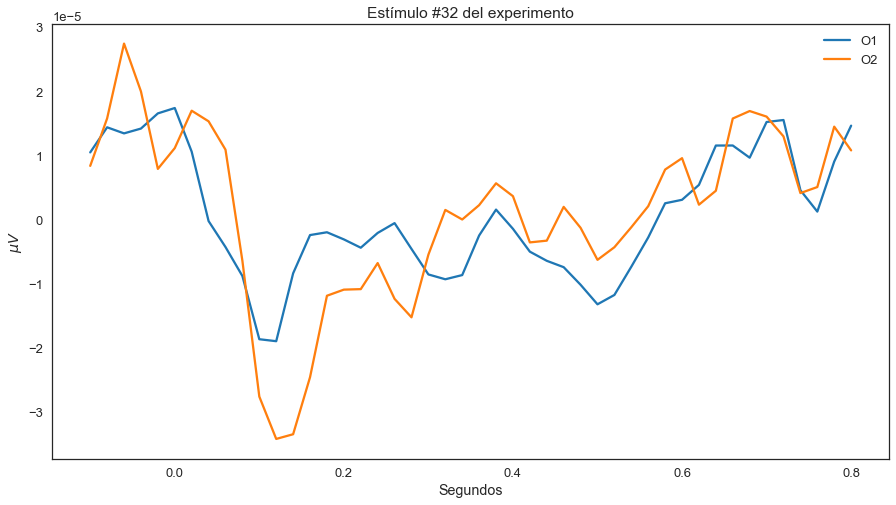

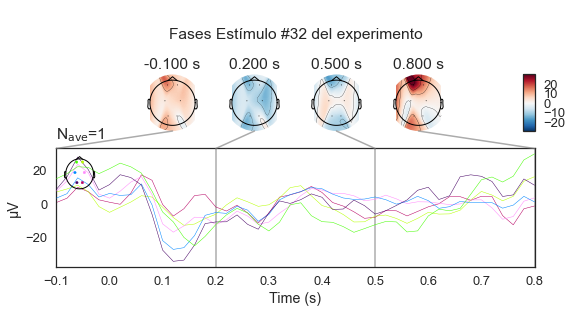

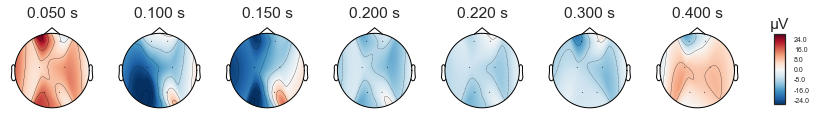

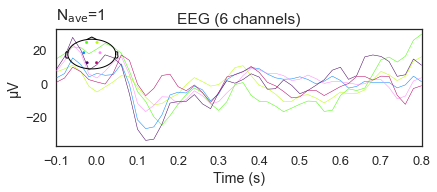

################################ Estímulo #40 ################################


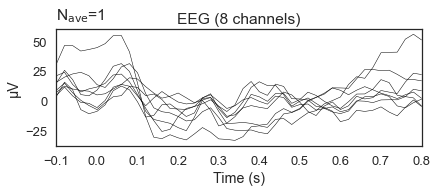

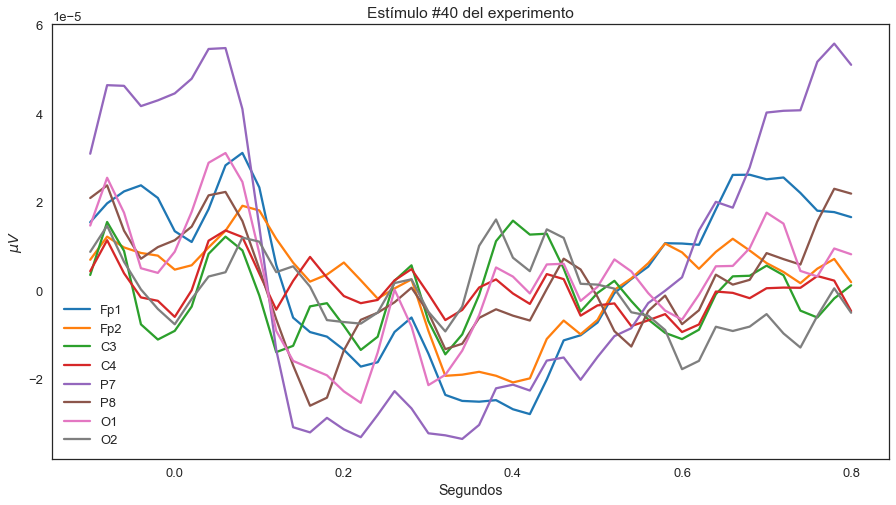

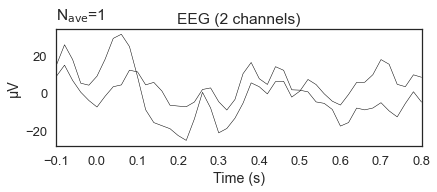

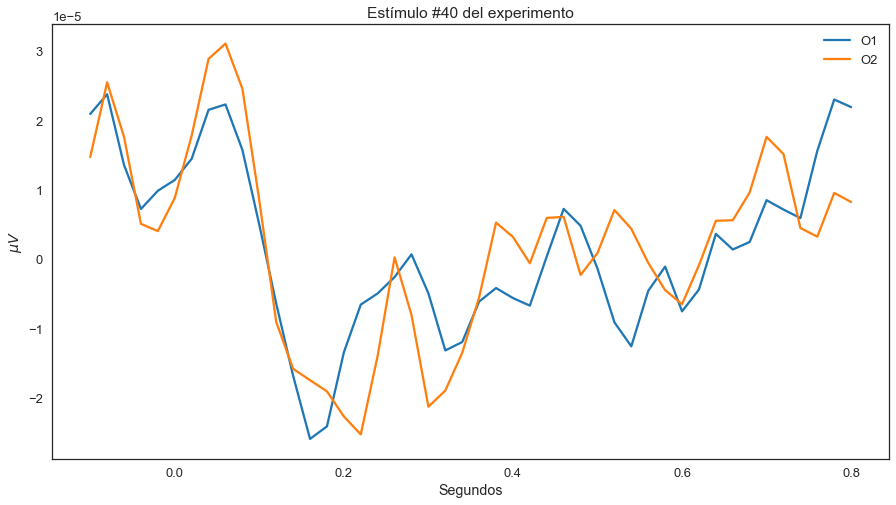

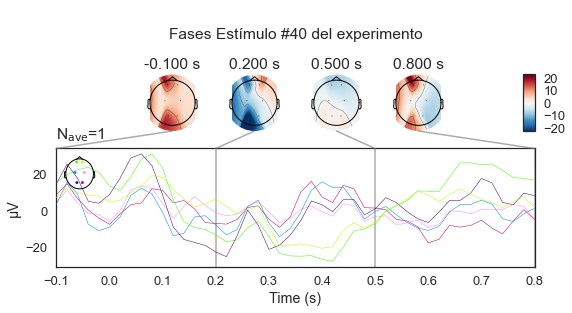

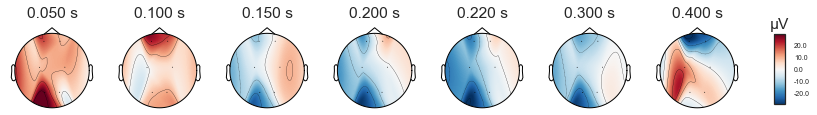

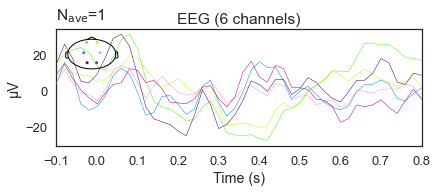

################################ Estímulo #67 ################################


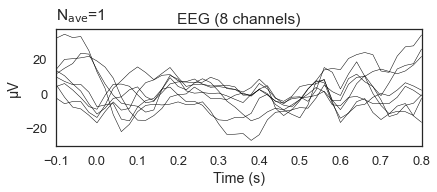

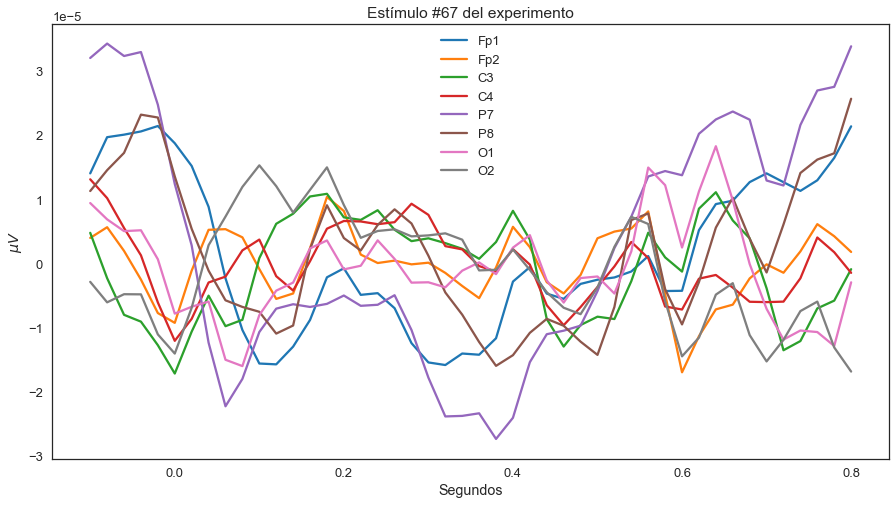

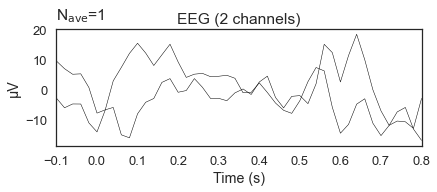

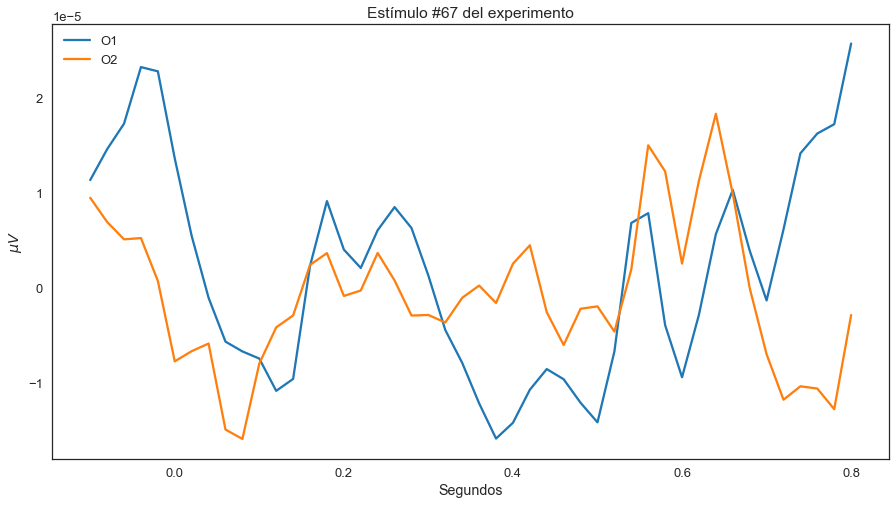

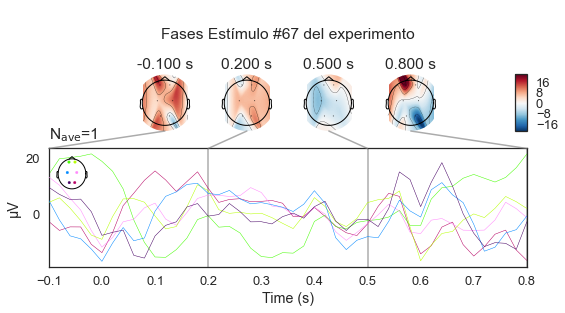

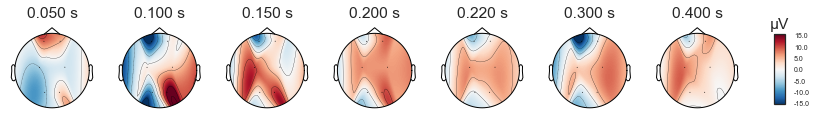

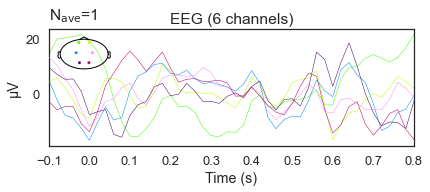

################################ Estímulo #82 ################################


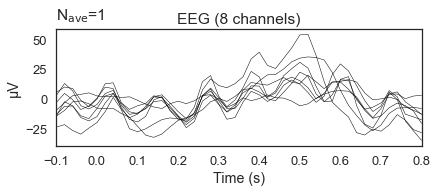

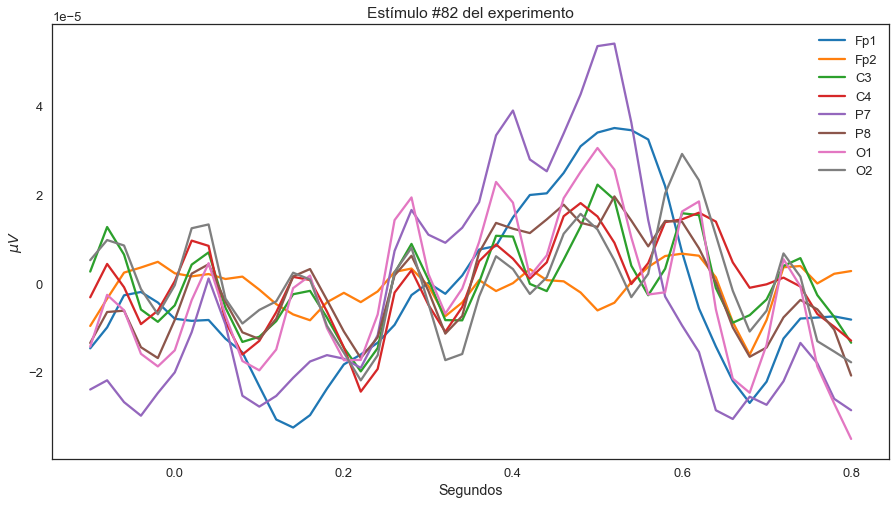

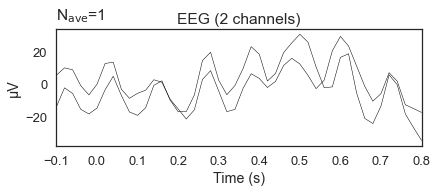

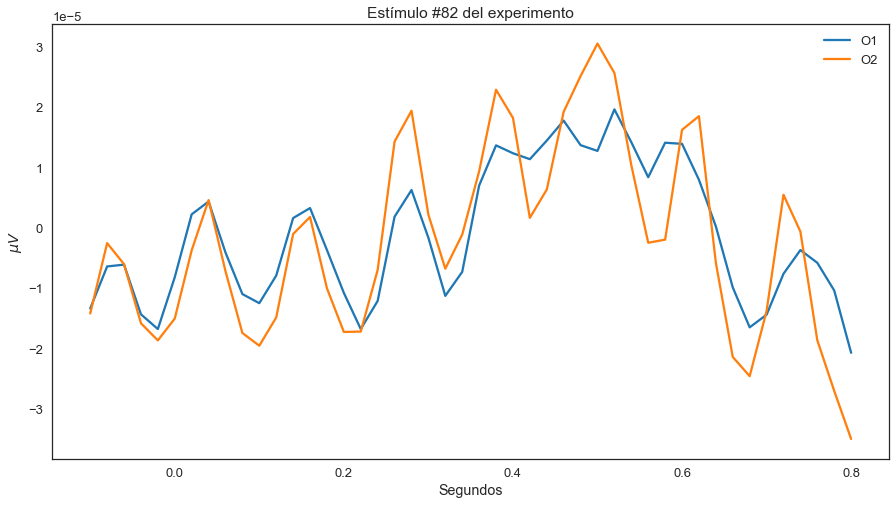

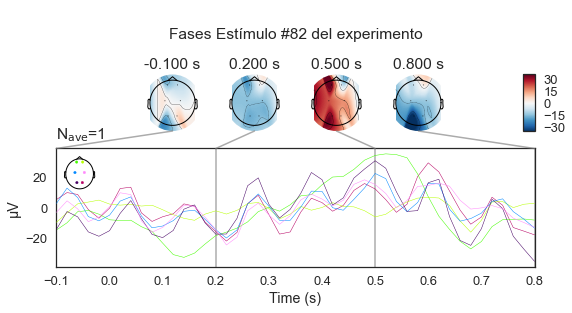

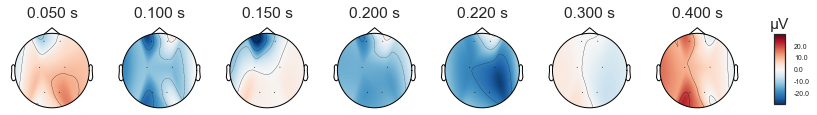

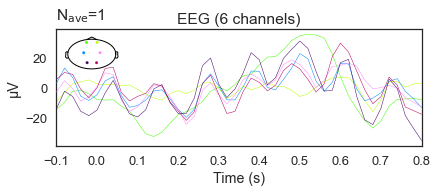

In [77]:
# for ep in epochs:
#     print(ep)

#data_ini_occipital, times_ini_occipital = raw[-3:-1, int(sfreq * 1):int(sfreq * 10)]
def plot_all_evoked():
    mne.viz.plot_evoked(ev)
    fig = plt.subplots(figsize=(15, 8))
    plt.plot(ev.times, ev.data.T);
    plt.xlabel('Segundos')
    plt.ylabel('$\mu V$')
    plt.title('Estímulo #{} del experimento'.format(ii));
    plt.legend(raw.ch_names[:-1]);

def plot_occipital_evoked():
    mne.viz.plot_evoked(ev, picks=['O1', 'O2'])
    fig = plt.subplots(figsize=(15, 8))
    plt.plot(ev.times, ev.data[-3:-1].T);
    plt.xlabel('Segundos')
    plt.ylabel('$\mu V$')
    plt.title('Estímulo #{} del experimento'.format(ii));
    plt.legend(raw.ch_names[-3:-1]);
    # Para excluir los electrodos laterales -> distorsionan la figura.
    ev.plot_joint(times="auto", title='Fases Estímulo #{} del experimento'.format(ii), exclude=['P7', 'P8'])
    

for ii, ev in enumerate(epochs.iter_evoked(True)):
    if (ev.comment == '1'):
        print("################################ Estímulo #{} ################################".format(ii))
        plot_all_evoked()
        plot_occipital_evoked()
        ev.pick(['eeg'], exclude=['FP1', 'FP2', 'P7', 'P8'])
#         fig = ev.plot_topomap(times=np.linspace(0.00, 0.1, 10), ch_type='eeg', colorbar=True)
        fig = ev.plot_topomap(times=[0.05, 0.1, 0.15, 0.2, 0.22, 0.3, 0.4], ch_type='eeg', colorbar=True)

        ev.plot(picks='eeg', spatial_colors=True)
        

        


#         data_evk, times_evk = rawaux[:-1, int(sfreq * 1):int(sfreq * 10)]
#         fig = plt.subplots(figsize=(15, 8))
#         plt.plot(times_f, data_f.T);
#         plt.xlabel('Segundos')
#         plt.ylabel('$\mu V$')
#         plt.title('Señal filtrada | Lower: {} | Upper: {}. Canales O1 y O2. 10 segundos'.format(lower, upper));
#         plt.legend(rawaux.ch_names[:-1]);

    

In [30]:
import numpy as np

# Ugly hack due to acquisition problem when specifying the channel types
# layout = mne.channels.read_layout('Vectorview-mag.lout')
# layout.names = mne.utils._clean_names(layout.names, remove_whitespace=True)

# fig = epochs['Target'].average().plot_topomap(times=np.linspace(0.05, 0.12, 5), ch_type='eeg', layout=layout)
# fig = epochs['Target'].average().plot_topomap(times=np.linspace(0.05, 0.12, 5), ch_type='eeg')

## Ploteamos la clase Epochs

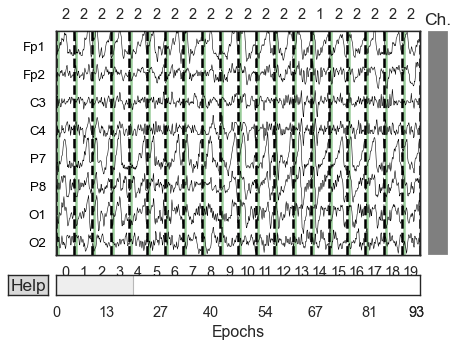

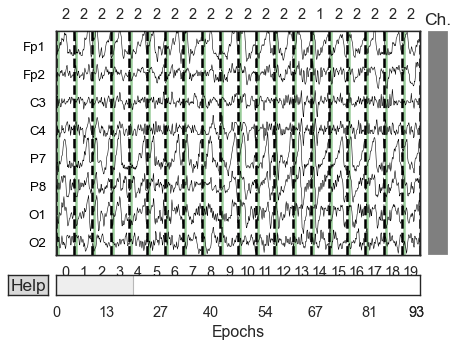

In [31]:
epochs.plot(scalings='auto', block=True)

## Compute ICA components on epochs ---> XDAWN is better?
- https://mne.tools/dev/auto_examples/preprocessing/plot_run_ica.html

## XDAWN

5 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


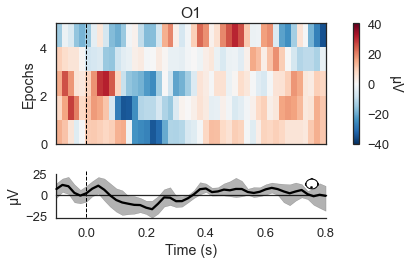

5 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


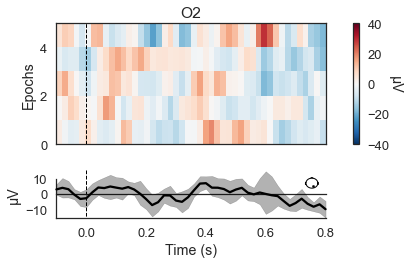

[<Figure size 432x288 with 4 Axes>]

In [32]:
mne.viz.plot_epochs_image(epochs['Target'], picks=['O1'], vmin=-40, vmax=40)
mne.viz.plot_epochs_image(epochs['Target'], picks=['O2'], vmin=-40, vmax=40)


In [33]:
from mne.preprocessing import Xdawn

# Estimates signal covariance
signal_cov = mne.compute_raw_covariance(raw_notch_and_filter_downsamp, picks='eeg')

# Xdawn instance
xd = Xdawn(n_components=2, signal_cov=signal_cov)

# Fit xdawn
xd.fit(epochs)

Using up to 887 segments
Number of samples used : 8870
[done]
Computing rank from data with rank='full'
    EEG: rank 8 from info
Reducing data rank from 8 -> 8
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank='full'
    EEG: rank 8 from info
Reducing data rank from 8 -> 8
Estimating covariance using EMPIRICAL
Done.


Xdawn(correct_overlap='auto', n_components=2, reg=None,
   signal_cov=<Covariance  |  size : 8 x 8, n_samples : 8869, data : [[ 2.02769e-05  9.50935e-06  5.90663e-06  6.37658e-06 -3.43631e-08
  -3.05820e-07  4.69249e-06  5.38457e-06]
 [ 9.50935e-06  1.11153e-05  1.40446e-06  1.89338e-06 -3.59320e-07
  -5.30395e-07  1.59894e-06  3.78323e-06]
 [ 5.90663e-06  ...e-06  3.78323e-06  2.39998e-06  3.11979e-06 -1.45977e-07
  -2.04926e-07  2.59695e-06  4.13608e-06]]>)

Transforming to Xdawn space
Zeroing out 6 Xdawn components
Inverse transforming to sensor space
Transforming to Xdawn space
Zeroing out 6 Xdawn components
Inverse transforming to sensor space
94 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


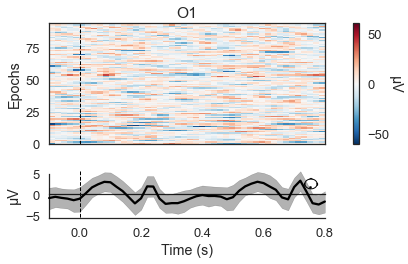

94 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


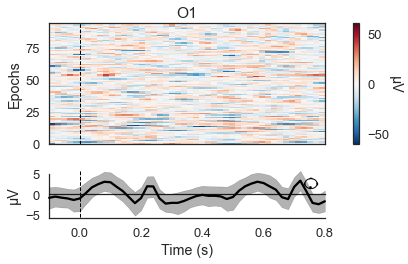

[<Figure size 432x288 with 4 Axes>]

In [34]:
epochs_denoised = xd.apply(epochs)

# Plot image epoch after Xdawn
mne.viz.plot_epochs_image(epochs_denoised['Target'], picks=['O1'], vmin=-60, vmax=60)
mne.viz.plot_epochs_image(epochs_denoised['Target'], picks=['O1'], vmin=-60, vmax=60)

{'Target': <Epochs  |   94 events (all good), -0.1 - 0.8 sec, baseline off, ~298 kB, data loaded,
 'NoTarget': 89
 'Target': 5>, 'NoTarget': <Epochs  |   94 events (all good), -0.1 - 0.8 sec, baseline off, ~298 kB, data loaded,
 'NoTarget': 89
 'Target': 5>}
################################ Estímulo #14 ################################


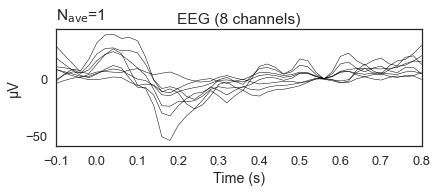

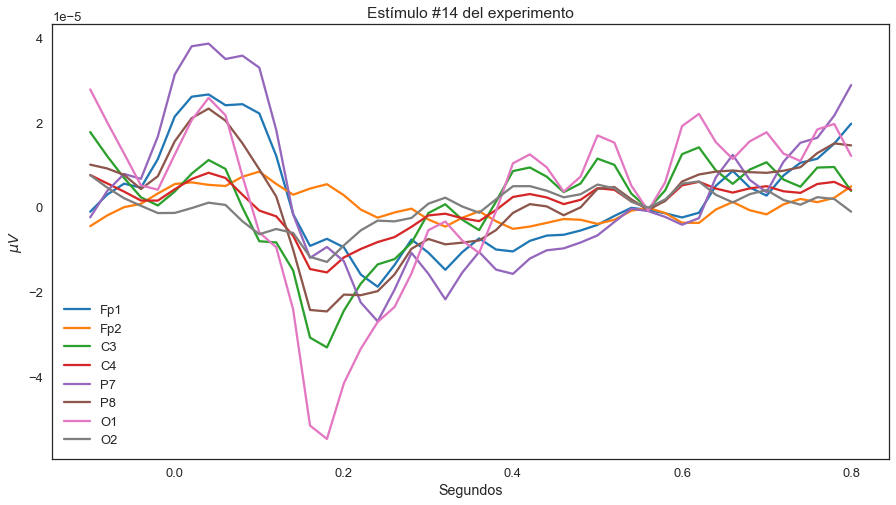

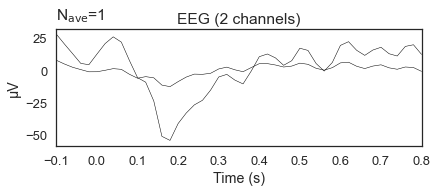

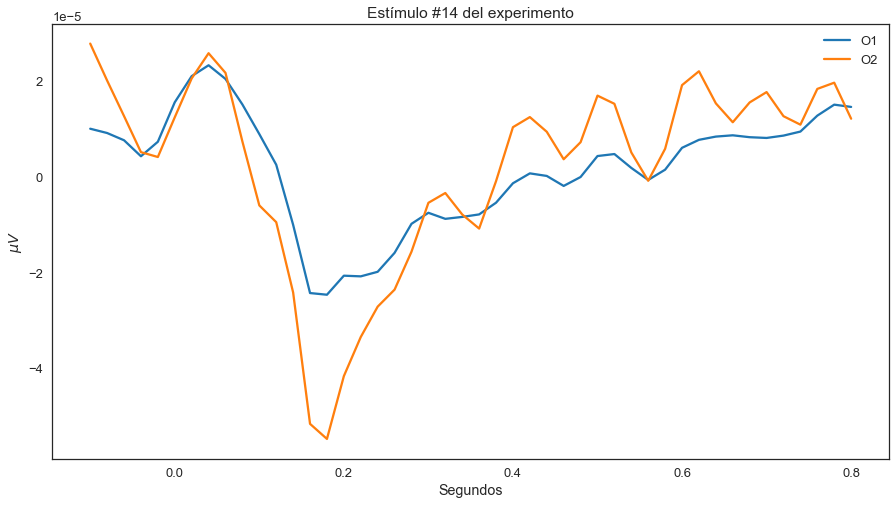

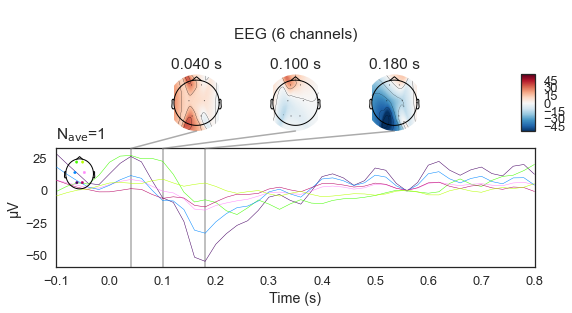

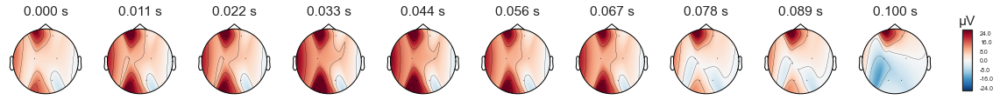

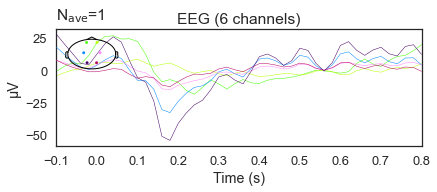

################################ Estímulo #32 ################################


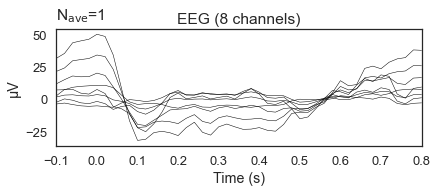

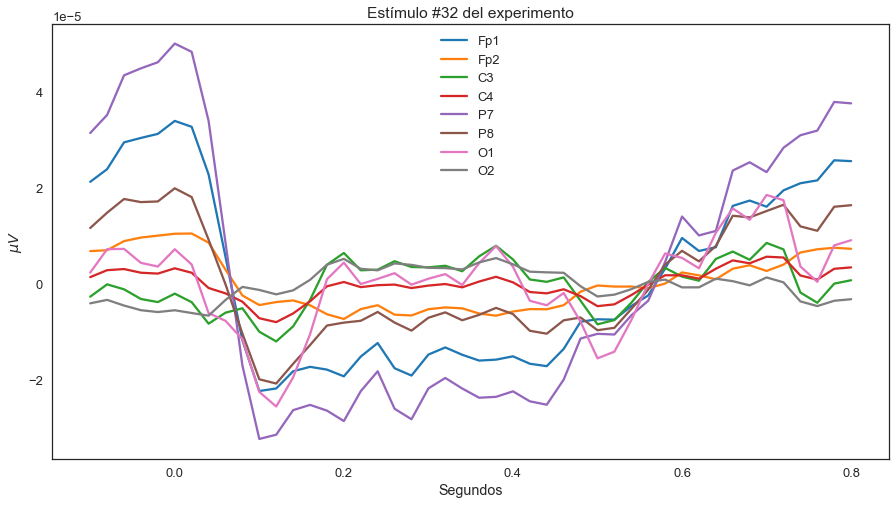

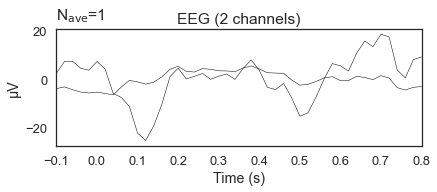

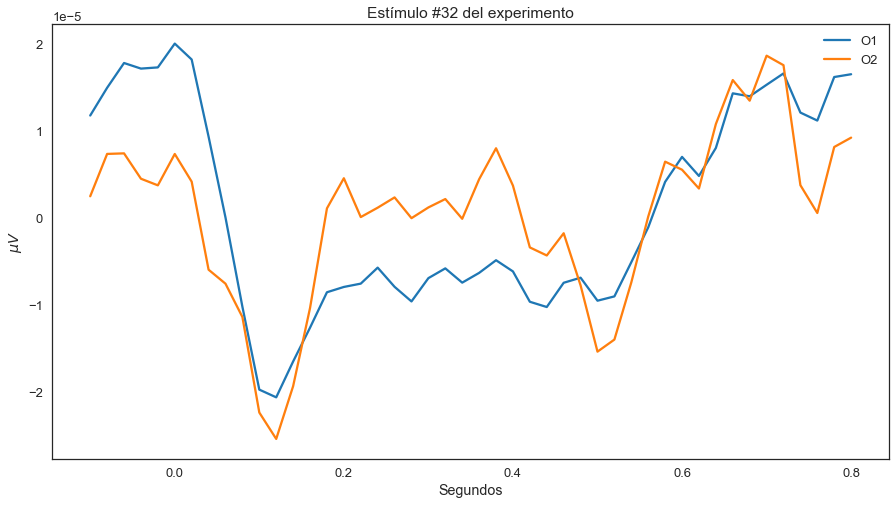

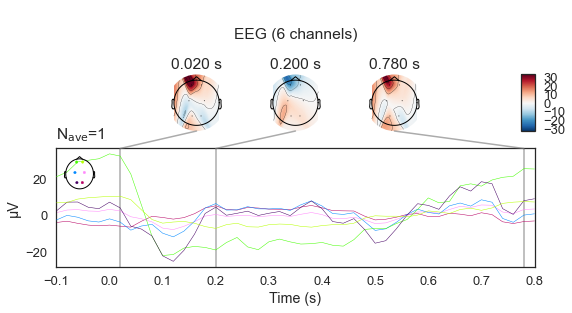

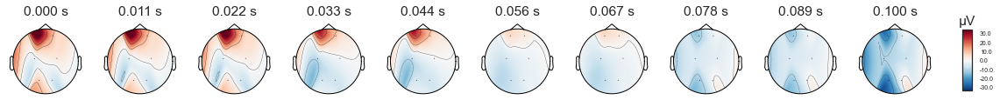

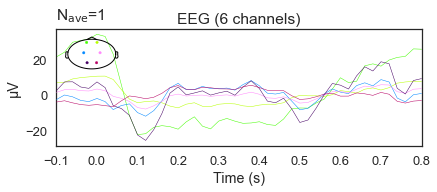

################################ Estímulo #40 ################################


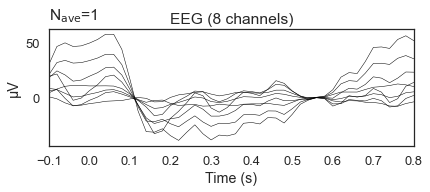

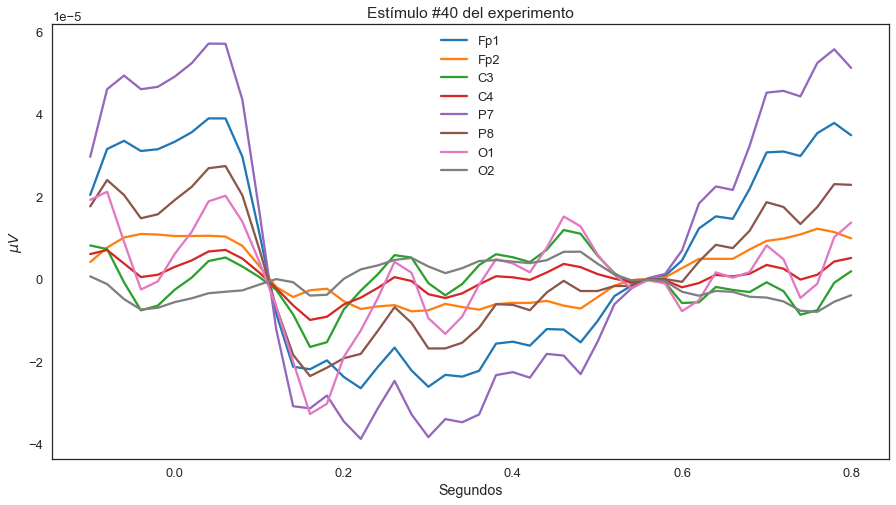

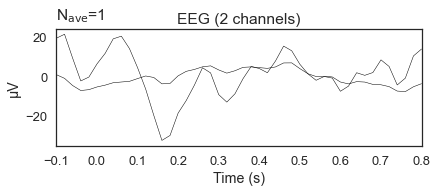

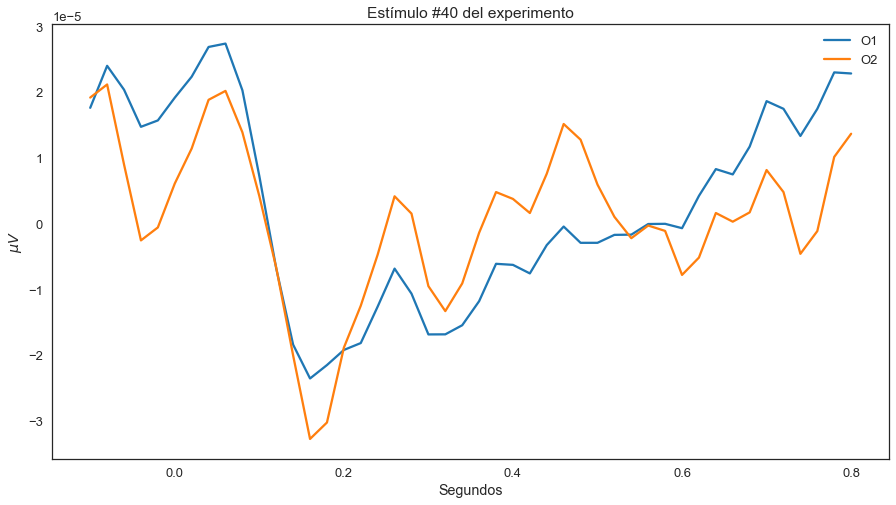

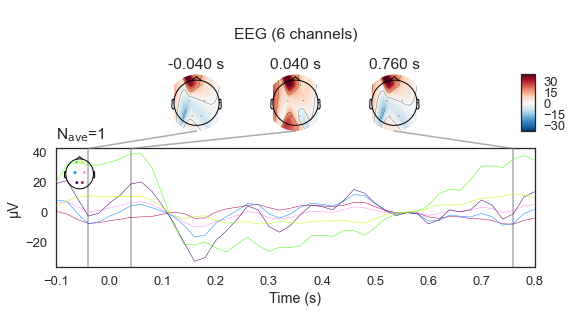

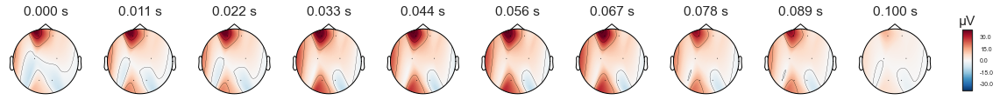

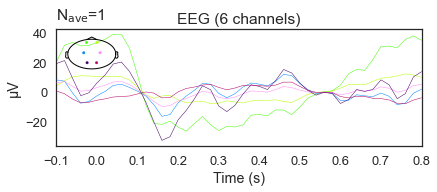

################################ Estímulo #67 ################################


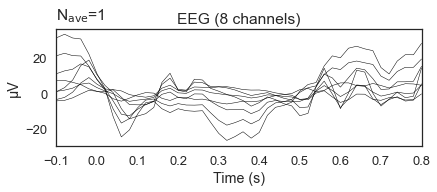

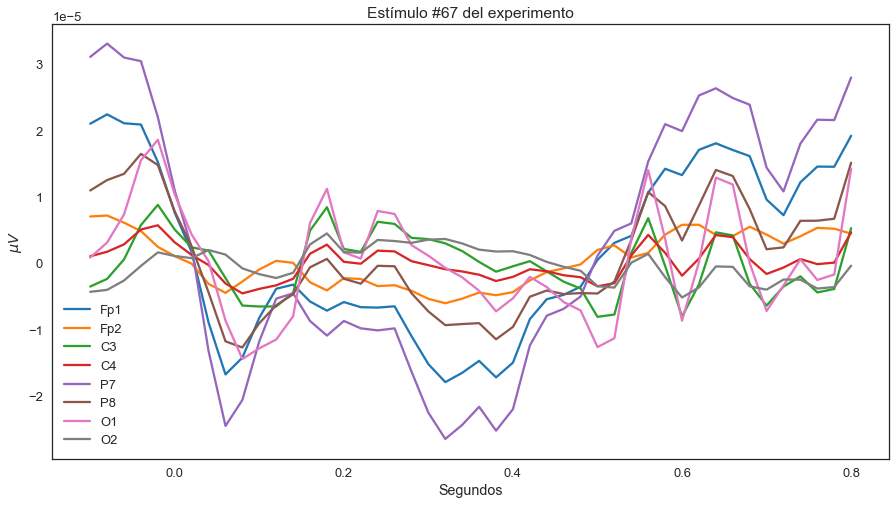

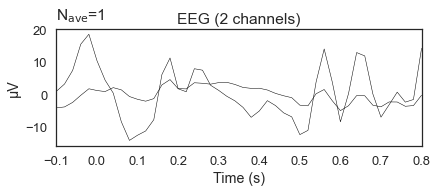

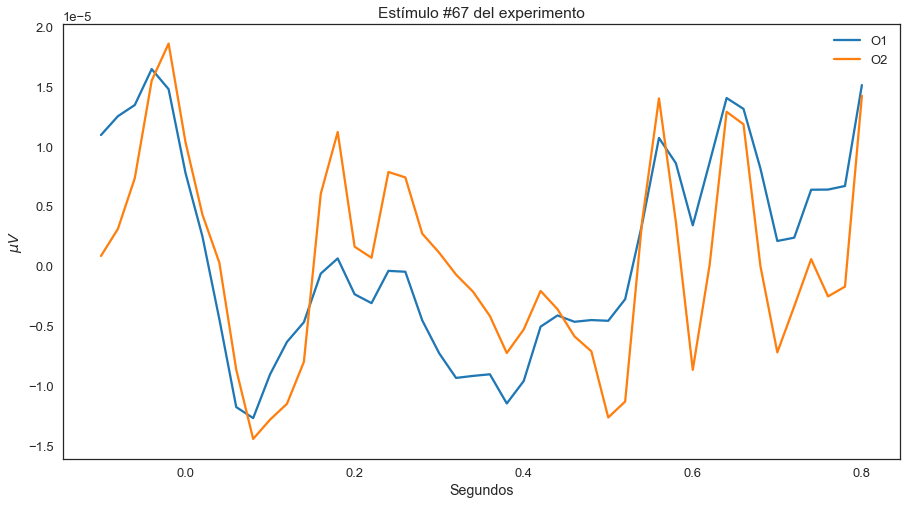

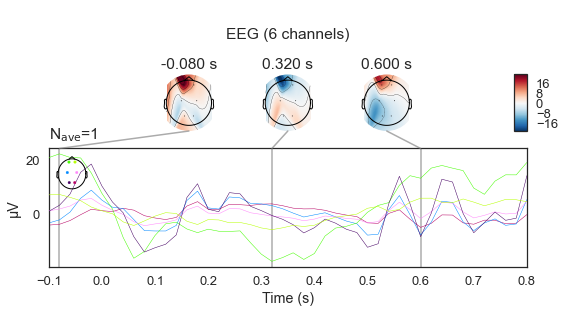

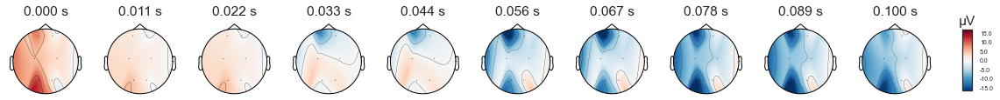

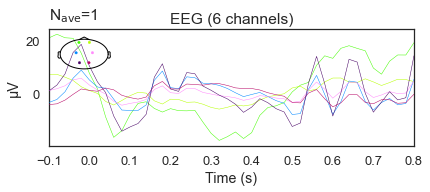

################################ Estímulo #82 ################################


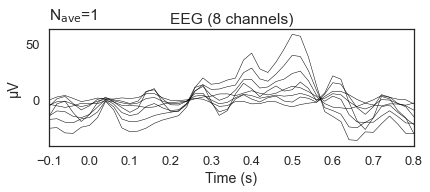

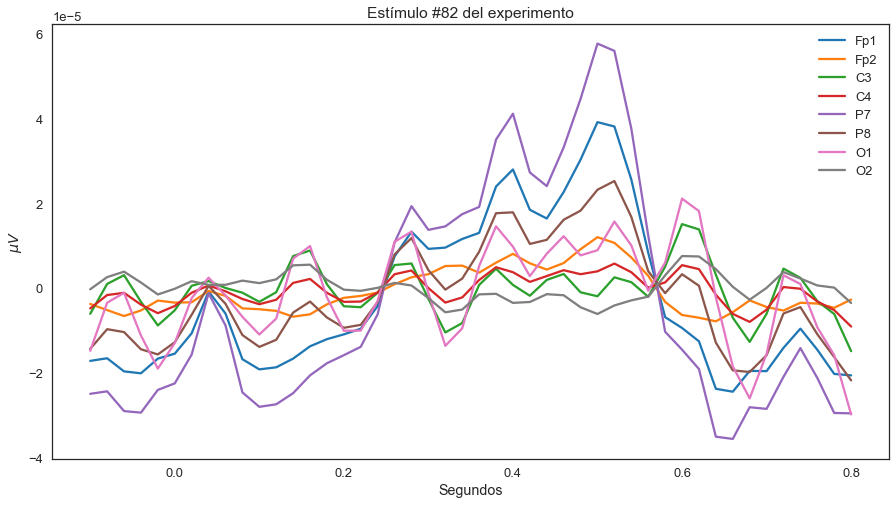

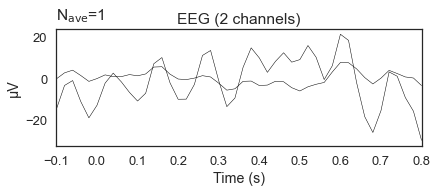

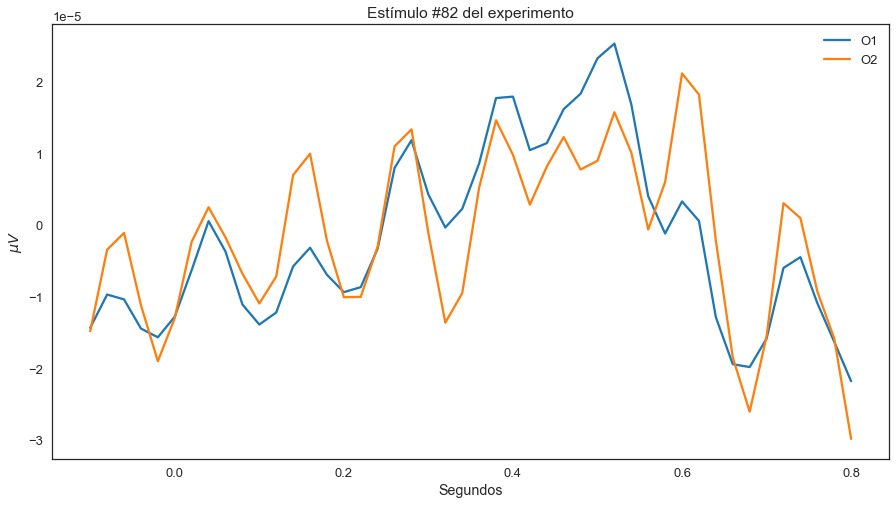

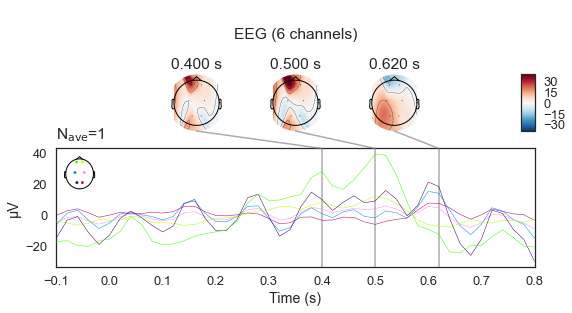

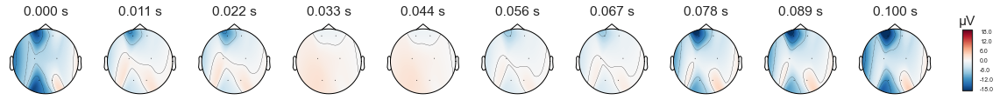

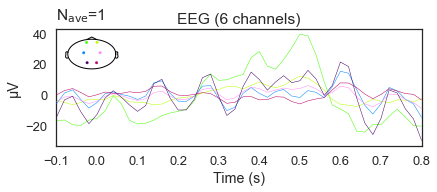

In [68]:
print(epochs_denoised)
for ii, ev in enumerate(epochs_denoised['Target'].iter_evoked(True)):
    if (ev.comment == '1'):
        print("################################ Estímulo #{} ################################".format(ii))
        plot_all_evoked()
        plot_occipital_evoked()
        ev.pick(['eeg'], exclude=['P7', 'P8'])
        fig = ev.plot_topomap(times=np.linspace(0.00, 0.1, 10), ch_type='eeg', colorbar=True)
        ev.plot(picks='eeg', spatial_colors=True)

## Obtenemos gráfica media de los potenciales evocados en cada electrodo colocado

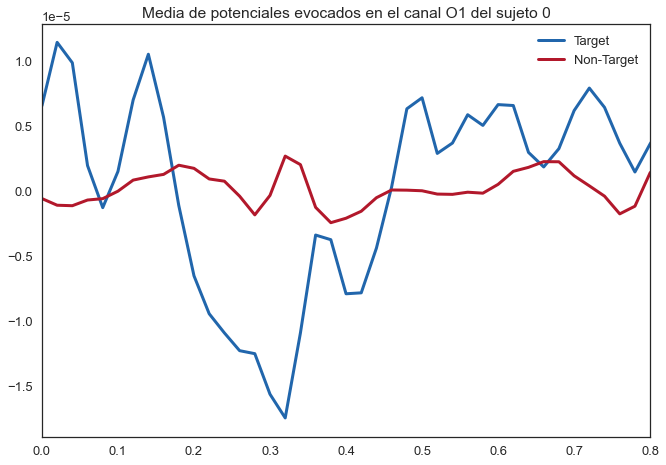

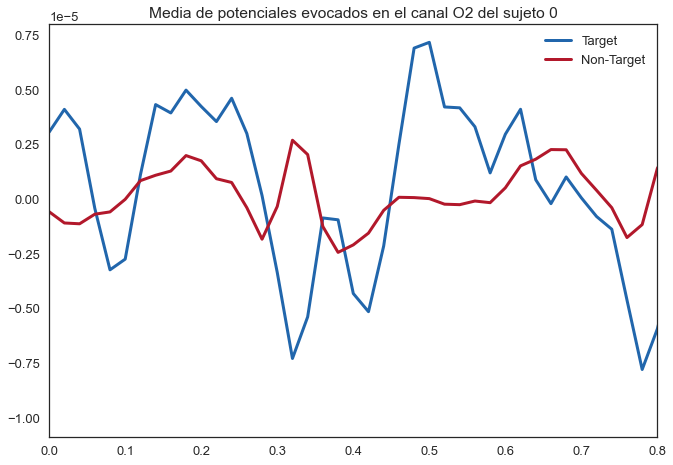

In [36]:
fig, ax = plt.subplots(facecolor='white', figsize=(10.9, 7.6))
evkTarget = epochs['Target'].average().data[ch_names['O1'], :]
evkNoTarget = epochs['NoTarget'].average().data[ch_names['O1'], :]
t = np.arange(len(evkTarget)) / epochs.info['sfreq']
ax.plot(t, evkTarget, c='#2166ac', lw=3.0, label='Target')
ax.plot(t, evkNoTarget, c='#b2182b', lw=3.0, label='Non-Target')
ax.set_xlim(0, 0.8)
ax.set_title('Media de potenciales evocados en el canal O1 del sujeto ' + str(subject))
ax.legend()

filename = './evoked/O1_evoked_potentials_subject_' + str(subject).zfill(2) + '_' + str(session) + '.pdf'
fig.savefig(filename, format='pdf')


fig, ax = plt.subplots(facecolor='white', figsize=(10.9, 7.6))
evkTarget = epochs['Target'].average().data[ch_names['O2'], :]
evkNoTarget = epochs['NoTarget'].average().data[ch_names['O1'], :]
t = np.arange(len(evkTarget)) / epochs.info['sfreq']
ax.plot(t, evkTarget, c='#2166ac', lw=3.0, label='Target')
ax.plot(t, evkNoTarget, c='#b2182b', lw=3.0, label='Non-Target')
ax.set_xlim(0, 0.8)
ax.set_title('Media de potenciales evocados en el canal O2 del sujeto ' + str(subject))
ax.legend()

filename = './evoked/O2_evoked_potentials_subject_' + str(subject).zfill(2) + '_' + str(session) + '.pdf'
fig.savefig(filename, format='pdf')

## Same anterior pero con Epoch generado por XDAWN

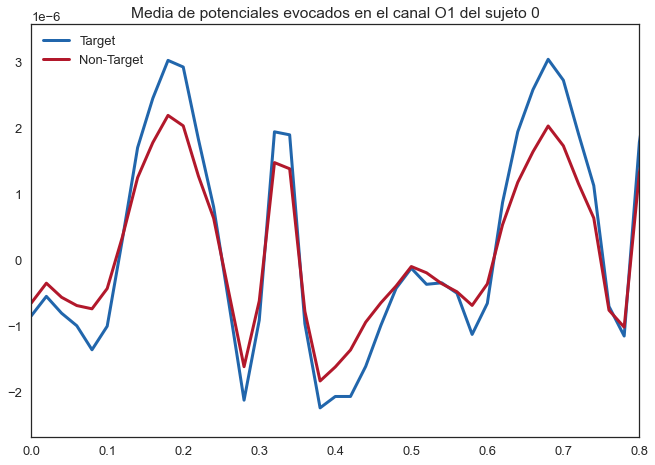

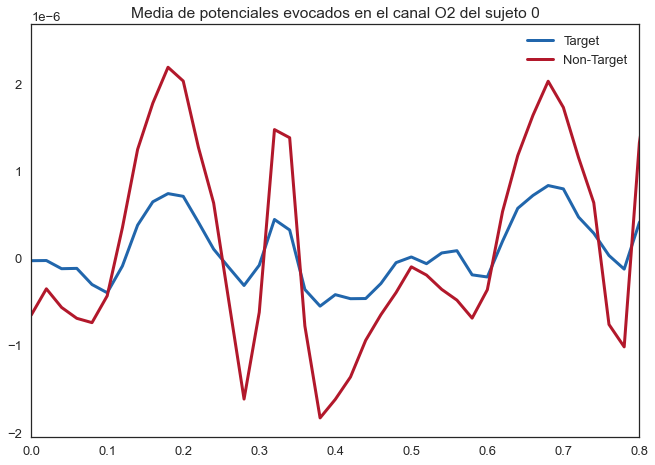

In [37]:
fig, ax = plt.subplots(facecolor='white', figsize=(10.9, 7.6))
evkTarget = epochs_denoised['Target'].average().data[ch_names['O1'], :]
evkNoTarget = epochs_denoised['NoTarget'].average().data[ch_names['O1'], :]
t = np.arange(len(evkTarget)) / epochs.info['sfreq']
ax.plot(t, evkTarget, c='#2166ac', lw=3.0, label='Target')
ax.plot(t, evkNoTarget, c='#b2182b', lw=3.0, label='Non-Target')
ax.set_xlim(0, 0.8)
ax.set_title('Media de potenciales evocados en el canal O1 del sujeto ' + str(subject))
ax.legend()

filename = './evoked/O1_evoked_potentials_subject_' + str(subject).zfill(2) + '_' + str(session) + '.pdf'
fig.savefig(filename, format='pdf')


fig, ax = plt.subplots(facecolor='white', figsize=(10.9, 7.6))
evkTarget = epochs_denoised['Target'].average().data[ch_names['O2'], :]
evkNoTarget = epochs_denoised['NoTarget'].average().data[ch_names['O1'], :]
t = np.arange(len(evkTarget)) / epochs.info['sfreq']
ax.plot(t, evkTarget, c='#2166ac', lw=3.0, label='Target')
ax.plot(t, evkNoTarget, c='#b2182b', lw=3.0, label='Non-Target')
ax.set_xlim(0, 0.8)
ax.set_title('Media de potenciales evocados en el canal O2 del sujeto ' + str(subject))
ax.legend()

filename = './evoked/O2_evoked_potentials_subject_' + str(subject).zfill(2) + '_' + str(session) + '.pdf'
fig.savefig(filename, format='pdf')

## Mostramos plot de los sensores utilizados en el experimento

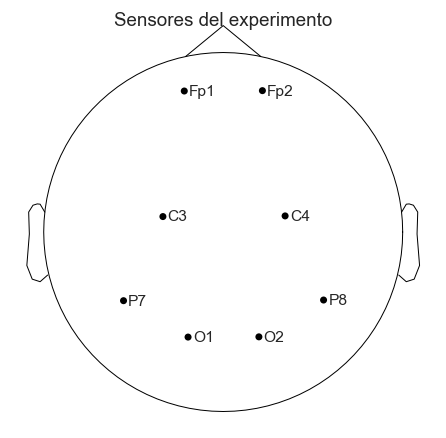

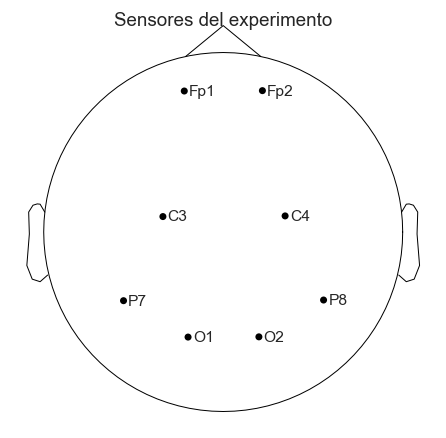

In [38]:
epochs.plot_sensors(kind='topomap', ch_type='eeg', title="Sensores del experimento", show_names=True)

## Mostramos plot del cerebro con aquellas zonas más intensas

In [39]:
#epochs.plot_topomap(times=[0.1], size=3., title=title, time_unit='s');
# epochs.plot_projs_topomap(vlim='joint')

    Using multitaper spectrum estimation with 7 DPSS windows


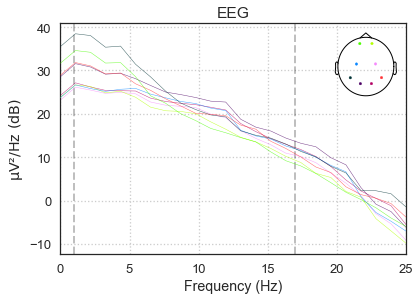

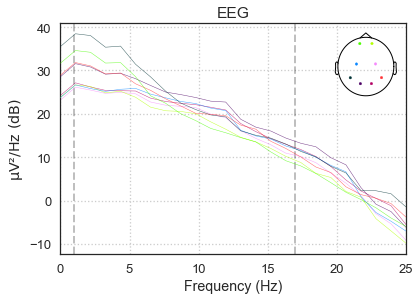

In [40]:
epochs['Target'].plot_psd(picks='eeg')

    Using multitaper spectrum estimation with 7 DPSS windows


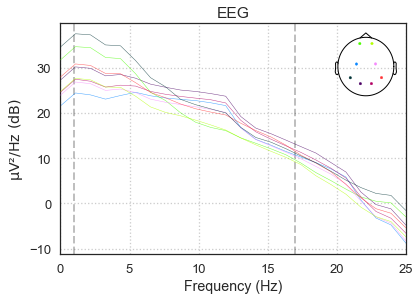

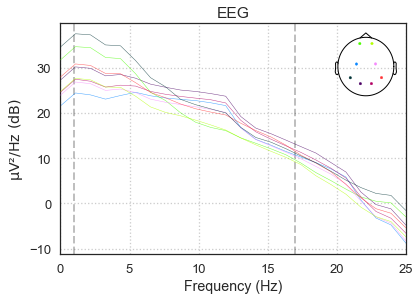

In [41]:
epochs['NoTarget'].plot_psd(picks='eeg')

## Más info

In [42]:
print('Hits:')
print('Epochs x channels x time')
print(epochs.get_data().shape)
print('sample drop %: ', (1 - len(epochs.events) / len(events)) * 100)

Hits:
Epochs x channels x time
(94, 8, 46)
sample drop %:  15.315315315315313


## Downsampling via Epochs

Realizado con el rawdata -> básicamente es lo mismo que hacerlo con el Epoch (epoch es igual que raw pero lleva datos de eventos)

Epochs objects are a data structure for representing and analyzing equal-duration chunks of the EEG/MEG signal. Epochs are most often used to represent data that is time-locked to repeated experimental events (such as stimulus onsets or subject button presses), but can also be used for storing sequential or overlapping frames of a continuous signal (e.g., for analysis of resting-state activity; see Making equally-spaced Events arrays). Inside an Epochs object, the data are stored in an array of shape (n_epochs, n_channels, n_times).

Epochs objects have many similarities with Raw objects, including:

- They can be loaded from and saved to disk in .fif format, and their data can be exported to a NumPy array through the get_data() method or to a Pandas DataFrame through the to_data_frame() method.

- Both Epochs and Raw objects support channel selection by index or name, including pick(), pick_channels() and pick_types() methods.

- SSP projector manipulation is possible through add_proj(), del_proj(), and plot_projs_topomap() methods.

- Both Epochs and Raw objects have copy(), crop(), time_as_index(), filter(), and resample() methods.

- Both Epochs and Raw objects have times, ch_names, proj, and info attributes.

- Both Epochs and Raw objects have built-in plotting methods plot(), plot_psd(), and plot_psd_topomap().

In [43]:
# print('Original sampling rate:', epochs.info['sfreq'], 'Hz')
# # epochs_resampled = epochs.copy().resample(64, npad='auto')
# epochs_resampled = epochs.copy().resample(50, npad='auto')
# print('New sampling rate:', epochs_resampled.info['sfreq'], 'Hz')

# # Plot a piece of data to see the effects of downsampling
# plt.figure(figsize=(7, 3))

# n_samples_to_plot = int(0.5 * epochs.info['sfreq'])  # plot 0.5 seconds of data
# plt.plot(epochs.times[:n_samples_to_plot],
#          epochs.get_data()[0, 0, :n_samples_to_plot], color='black')

# n_samples_to_plot = int(0.5 * epochs_resampled.info['sfreq'])
# plt.plot(epochs_resampled.times[:n_samples_to_plot],
#          epochs_resampled.get_data()[0, 0, :n_samples_to_plot],
#          '-o', color='red')

# plt.xlabel('time (s)')
# plt.legend(['original', 'downsampled'], loc='best')
# plt.title('Effect of downsampling')

## Ploteo de la gráfica con y sin downsampling

In [44]:
# MEJOR HACERLO COMO ABAJO

# PLOT sin downsampling -> variable 'sampling_rate'
# channels_to_plot = 2;
# sfreq = raw.info['sfreq']
# data, times = raw[:channels_to_plot, int(sfreq * 1):int(sfreq * 10)]

# fig = plt.subplots(figsize=(10, 8))
# plt.plot(times, data.T);
# plt.xlabel('Seconds')
# plt.ylabel('$\mu V$')
# plt.title('Channels: 1-2');
# plt.legend(raw.ch_names[:channels_to_plot]);

# # PLOT con downsampling -> ratio de 5 -> 255/5 = 50
# channels_to_plot = 2;
# sfreq = raw.info['sfreq']
# data, times = raw[:channels_to_plot, int(sfreq * 1):int(sfreq * 10)]

# fig = plt.subplots(figsize=(10, 8))
# plt.plot(times, data.T);
# plt.xlabel('Seconds')
# plt.ylabel('$\mu V$')
# plt.title('Channels: 1-2');
# plt.legend(raw.ch_names[:channels_to_plot]);

In [45]:
# aux_ev = pick_events(events)



# # PLOT sin downsampling -> variable 'epochs'

# plt.figure(figsize=(20, 3))

# n_samples_to_plot = int(0.5 * epochs.info['sfreq'])  # plot 0.5 seconds of data
# plt.plot(epochs.times[:n_samples_to_plot], epochs.get_data()[0, -2, :n_samples_to_plot], color='black')
# plt.plot(epochs.times[:n_samples_to_plot], epochs.get_data()[0, -1, :n_samples_to_plot], color='red')


# plt.xlabel('time (s)')
# plt.legend(['Channel O1', 'Channel O2'], loc='best')
# plt.title('Aplicación de muestreo 250 Hz')

# # PLOT con downsampling -> variable 'epochs_resampled'

# plt.figure(figsize=(20, 3))

# n_samples_to_plot = int(0.5 * epochs_resampled.info['sfreq'])
# plt.plot(epochs_resampled.times[:n_samples_to_plot], epochs_resampled.get_data()[0, 0, :n_samples_to_plot], color='black')
# plt.plot(epochs_resampled.times[:n_samples_to_plot], epochs_resampled.get_data()[0, 1, :n_samples_to_plot], color='red')


# plt.xlabel('time (s)')
# plt.legend(['Channel O1', 'Channel O2'], loc='best')
# plt.title('Aplicación de muestreo 50 Hz')

5 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
5 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


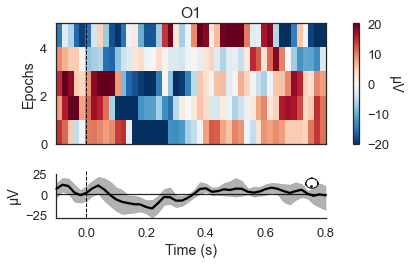

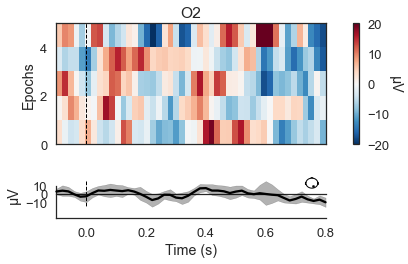

5 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
combining channels using "gfp"


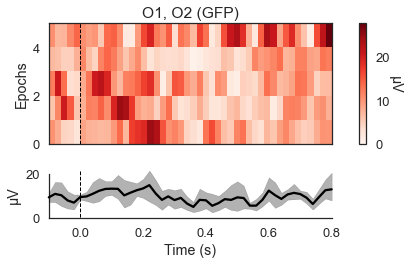

[<Figure size 432x288 with 3 Axes>]

In [46]:
epochs['Target'].plot_image(picks=['O1', 'O2'], vmin=-20, vmax=20)
epochs['Target'].plot_image(picks=['O1', 'O2'], combine='gfp')


## Comparar épocas

https://mne.tools/stable/auto_tutorials/intro/plot_10_overview.html#sphx-glr-auto-tutorials-intro-plot-10-overview-py
muy interesante el hecho de cd tenga epocas, compararlas con plot_compare_evokeds

- Media de los targets (supuesto p300, momentos exactos donde mostramos la imagen)

combining channels using "gfp"


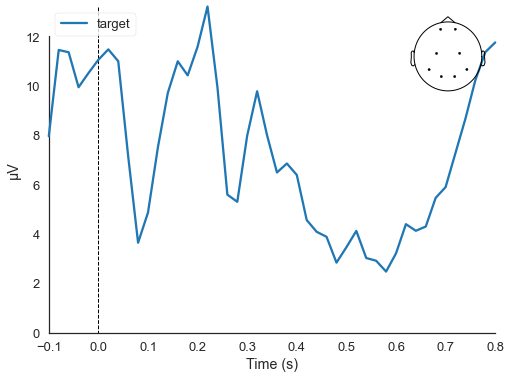

[<Figure size 576x432 with 2 Axes>]

In [47]:
mne.viz.plot_compare_evokeds(dict(target=epochs['Target'].average()),
                             legend='upper left', show_sensors='upper right')

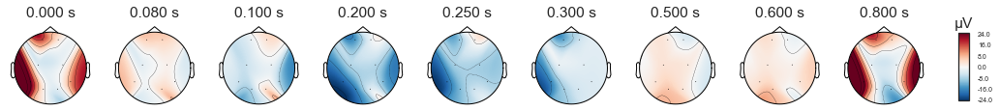

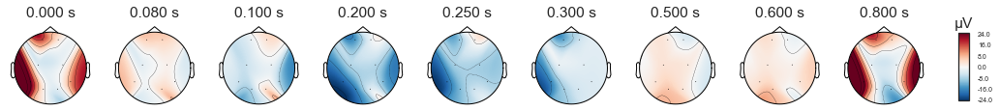

In [48]:
epochs['Target'].average().plot_topomap(times=[0., 0.08, 0.1, 0.2, 0.25, 0.3, 0.5, 0.6, 0.8], ch_type='eeg')

## Ploteo de eventos con 3 subfiguras

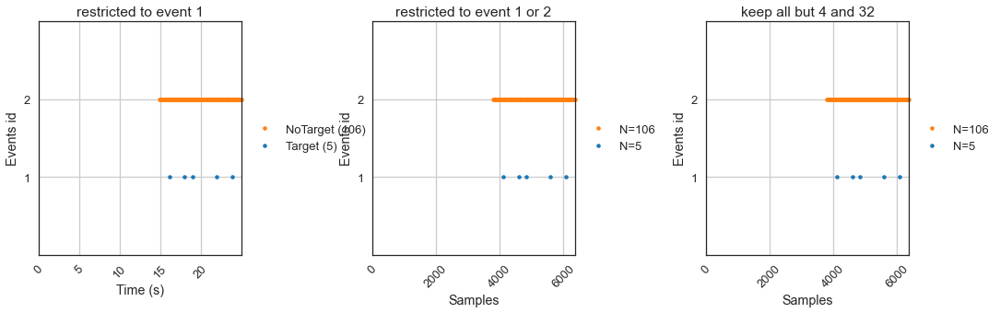

In [49]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
# mne.viz.plot_events(events, event_id=event_dict, sfreq=raw.info['sfreq'],
#                           first_samp=raw.first_samp)
mne.viz.plot_events(events, event_id=event_id, sfreq=raw.info['sfreq'], first_samp=raw.first_samp, axes=axs[0], show=False)
axs[0].set(title="restricted to event 1")

mne.viz.plot_events(events, axes=axs[1], show=False)
axs[1].set(title="restricted to event 1 or 2")

mne.viz.plot_events(events, axes=axs[2], show=False)
axs[2].set(title="keep all but 4 and 32")
plt.setp([ax.get_xticklabels() for ax in axs], rotation=45)
plt.tight_layout()
plt.show()

## Plot de cerebros

times: 10 instantes aleatorios entre 0.05 segundos y 0.8 segundos

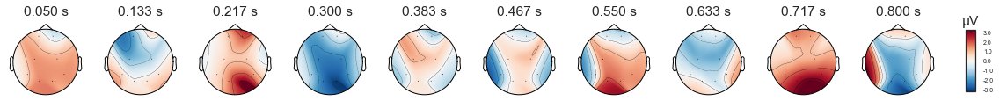

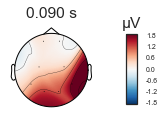

Text(0.5, 0.05, 'average from 40-140 ms')

In [50]:
times = np.linspace(0.05, 0.8, 10)
epochs.average().plot_topomap(ch_type='eeg', times=times, colorbar=True)

fig = epochs.average().plot_topomap(ch_type='eeg', times=0.09, average=0.1)
fig.text(0.5, 0.05, 'average from 40-140 ms', ha='center')

## Image plot

Interesante para ver en que momentos hay un pico alto de voltage y en qué canal exacto se está produciendo

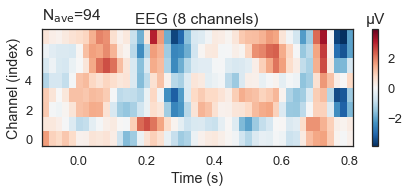

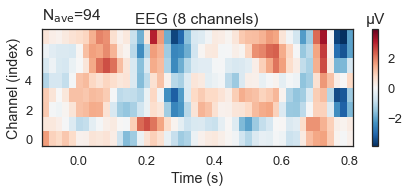

In [51]:
epochs.average().plot_image(picks='eeg')

## Ploteo con condiciones

fig, ax = plot_conditions(epochs, ch_ind=[4,5,6,7], conditions=conditions, ci=97.5, n_boot=1000, title='', diff_waveform=(1,2))


In [ ]:
# conditions = OrderedDict()
# conditions['Non-target'] = [1]
# # conditions['Target'] = [2]
# conditions['Target'] = [2]

# # print(epochs)

# fig, ax = plot_conditions(epochs, conditions=conditions, ci=97.5, n_boot=1000, title='', diff_waveform=(1,2))

# # # fig, ax = plot_conditions(epochs_resampled, conditions=conditions, ci=97.5, n_boot=1000, title='', diff_waveform=(1, 2))

In [ ]:
# fig, ax = plot_conditions(epochs, ch_ind=[4,5,6,7], conditions=conditions, ci=97.5, n_boot=1000, title='', diff_waveform=(1,2))


In [ ]:
## Clasificación

In [ ]:
from sklearn.pipeline import make_pipeline

from mne.decoding import Vectorizer

from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

from sklearn.model_selection import cross_val_score, StratifiedShuffleSplit

from pyriemann.estimation import ERPCovariances
from pyriemann.tangentspace import TangentSpace
from pyriemann.classification import MDM
from pyriemann.spatialfilters import Xdawn
import pandas as pd
import seaborn as sns
from datetime import datetime as dt


from collections import OrderedDict

def ejecutar_clasificador(epochs):
    clfs = OrderedDict()

    clfs['Vect + LR'] = make_pipeline(Vectorizer(), StandardScaler(), LogisticRegression())
    clfs['Vect + RegLDA'] = make_pipeline(Vectorizer(), LDA(shrinkage='auto', solver='eigen'))
    clfs['Xdawn + RegLDA'] = make_pipeline(Xdawn(2, classes=[1]), Vectorizer(), LDA(shrinkage='auto', solver='eigen'))
    clfs['ERPCov + TS'] = make_pipeline(ERPCovariances(), TangentSpace(), LogisticRegression())
    clfs['ERPCov + MDM'] = make_pipeline(ERPCovariances(), MDM())

    print("Comienzo del proceso de clasificación del experimento: ", dt.now().strftime('%d-%m-%Y, %H:%M:%S (GMT+1)'))


    # format data
    epochs.pick_types(eeg=True)
    X = epochs.get_data() * 1e6
    times = epochs.times
    y = epochs.events[:, -1]

    # define cross validation
    cv = StratifiedShuffleSplit(n_splits=10, test_size=0.25, random_state=42)

    # run cross validation for each pipeline
    auc = []
    methods = []
    for m in clfs:
        res = cross_val_score(clfs[m], X, y==2, scoring='roc_auc', cv=cv, n_jobs=-1)
        auc.extend(res)
        methods.extend([m]*len(res))
        print("[{}] Puntuación = {}/1".format(m, np.mean(res)))

    print("Fin del proceso de clasificación del experimento: ", dt.now().strftime('%d-%m-%Y, %H:%M:%S (GMT+1)'))
    results = pd.DataFrame(data=auc, columns=['Área bajo curva (AUC)'])
    results['Método de clasificación'] = methods

    plt.figure(figsize=[8,4])
    sns.barplot(data=results, x='Área bajo curva (AUC)', y='Método de clasificación', ci=None)
    plt.xlim(0, 1)
    sns.despine()



In [ ]:
ejecutar_clasificador(epochs)

## Añadimos ruido al raw filtrado para ver si ya no podemos determinar el P300

In [ ]:
epochs_noise = epochs.copy()
cov = mne.make_ad_hoc_cov(epochs_noise.info)
rng = np.random.RandomState(0)

print(cov)

# cov['data'] tiene el ruido de cada canal
# podemos añadir ruido a todos los canales con fill
order_noise = 3.8
one_channel = cov['data'][0] # igual para todos por defecto, cogemos el primero
print(one_channel)
cov['data'].fill(one_channel * pow(10, order_noise))
one_channel_new = cov['data'][0]

print(cov)

epochs_noise_apply = mne.simulation.add_noise(epochs_noise, cov, iir_filter=[0.2, -0.2, 0.04], random_state=rng, verbose='ERROR')



# ax1.plot(times_ini, data_ini.T);
# ax1.set_title('Raw data original')
# ax1.set_xlabel('Segundos')
# ax1.set_ylabel('$\mu V$')

# ax2.plot(times_f, data_f.T);
# ax2.set_title('Raw data filtrado')
# ax2.set_xlabel('Segundos')

# plt.legend(raw.ch_names[:8], loc=1);
# plt.tight_layout()

data_example = {}

print("Fragmento de la señal SIN ruido (mismas gráficas que las mostradas anteriormente) | Noise por canal: {}".format(one_channel))
for ii, ev in enumerate(epochs.iter_evoked(True)):
    if ev.comment == '1':
        if ii == 14:
#             plot_all_evoked()
            plot_occipital_evoked()

            
            data_example['0'] = [ev.times, ev.data[-3:-1].T]
    
            #fig = ev.plot_topomap(times=np.linspace(0.00, 0.1, 10), ch_type='eeg', colorbar=True)
            #ev.plot(picks='eeg', spatial_colors=True)

print("Fragmento de la señal CON ruido | Noise Order = {} | Noise por canal: {} |".format(order_noise, one_channel_new))
for ii, ev in enumerate(epochs_noise_apply.iter_evoked(True)):
    if ev.comment == '1':
        if ii == 14:
#             plot_all_evoked()
            plot_occipital_evoked()
            
            data_example['1'] = [ev.times, ev.data[-3:-1].T]
            #fig = ev.plot_topomap(times=np.linspace(0.00, 0.1, 10), ch_type='eeg', colorbar=True)
            #ev.plot(picks='eeg', spatial_colors=True)

ejecutar_clasificador(epochs_noise_apply)
# print(data_example)
# fig, (ax1, ax2) = plt.subplots(1,2, figsize = (40, 10))

# ax1.plot(data_example['0'][0], data_example['0'][1])
# ax1.set_xlabel('Segundos')
# ax1.set_ylabel('$\mu V$')
# ax1.set_title('abc')

# ax1.plot(data_example['1'][0], data_example['1'][0])
# ax1.set_xlabel('Segundos')
# ax1.set_ylabel('$\mu V$')
# ax1.set_title('def')      
# plt.legend(raw.ch_names[-3:-1], loc=1);            


In [ ]:
epochs.info

In [ ]:
raw_notch_and_filter_downsamp.info

In [52]:
# conditions = OrderedDict()
# conditions['Non-target'] = [1]
# # conditions['Target'] = [2]
# conditions['Target'] = [2]

# # print(epochs)

# fig, ax = plot_conditions(epochs, conditions=conditions, ci=97.5, n_boot=1000, title='', diff_waveform=(1,2))

# # # fig, ax = plot_conditions(epochs_resampled, conditions=conditions, ci=97.5, n_boot=1000, title='', diff_waveform=(1, 2))

In [53]:
# fig, ax = plot_conditions(epochs, ch_ind=[4,5,6,7], conditions=conditions, ci=97.5, n_boot=1000, title='', diff_waveform=(1,2))


## Clasificación

In [61]:
from sklearn.pipeline import make_pipeline

from mne.decoding import Vectorizer

from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

from sklearn.model_selection import cross_val_score, StratifiedShuffleSplit

from pyriemann.estimation import ERPCovariances
from pyriemann.tangentspace import TangentSpace
from pyriemann.classification import MDM
from pyriemann.spatialfilters import Xdawn
import pandas as pd
import seaborn as sns
from datetime import datetime as dt


from collections import OrderedDict

def ejecutar_clasificador(epochs):
    clfs = OrderedDict()

    clfs['Vect + LR'] = make_pipeline(Vectorizer(), StandardScaler(), LogisticRegression())
    clfs['Vect + RegLDA'] = make_pipeline(Vectorizer(), LDA(shrinkage='auto', solver='eigen'))
    clfs['Xdawn + RegLDA'] = make_pipeline(Xdawn(2, classes=[1]), Vectorizer(), LDA(shrinkage='auto', solver='eigen'))
    clfs['ERPCov + TS'] = make_pipeline(ERPCovariances(), TangentSpace(), LogisticRegression())
    clfs['ERPCov + MDM'] = make_pipeline(ERPCovariances(), MDM())

    print("Comienzo del proceso de clasificación del experimento: ", dt.now().strftime('%d-%m-%Y, %H:%M:%S (GMT+1)'))


    # format data
    epochs.pick_types(eeg=True)
    X = epochs.get_data() * 1e6
    times = epochs.times
    y = epochs.events[:, -1]

    # define cross validation
    cv = StratifiedShuffleSplit(n_splits=10, test_size=0.25, random_state=42)

    # run cross validation for each pipeline
    auc = []
    methods = []
    for m in clfs:
        res = cross_val_score(clfs[m], X, y==2, scoring='roc_auc', cv=cv, n_jobs=-1)
        auc.extend(res)
        methods.extend([m]*len(res))
        print("[{}] Puntuación = {}/1".format(m, np.mean(res)))

    print("Fin del proceso de clasificación del experimento: ", dt.now().strftime('%d-%m-%Y, %H:%M:%S (GMT+1)'))
    results = pd.DataFrame(data=auc, columns=['Área bajo curva (AUC)'])
    results['Método de clasificación'] = methods

    plt.figure(figsize=[8,4])
    sns.barplot(data=results, x='Área bajo curva (AUC)', y='Método de clasificación', ci=None)
    plt.xlim(0, 1)
    sns.despine()



Comienzo del proceso de clasificación del experimento:  20-07-2020, 18:02:16 (GMT+1)
[Vect + LR] Puntuación = 0.6304347826086956/1
[Vect + RegLDA] Puntuación = 0.5608695652173912/1
[Xdawn + RegLDA] Puntuación = 0.5173913043478261/1
[ERPCov + TS] Puntuación = 0.6695652173913045/1
[ERPCov + MDM] Puntuación = 0.7565217391304347/1
Fin del proceso de clasificación del experimento:  20-07-2020, 18:02:22 (GMT+1)


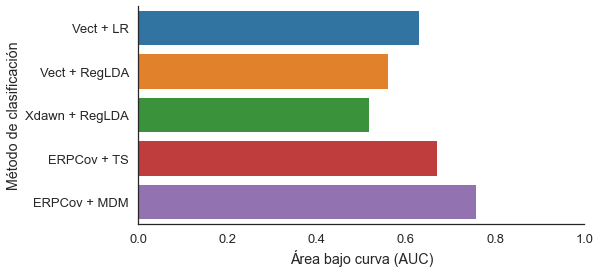

In [62]:
ejecutar_clasificador(epochs)

## Añadimos ruido al raw filtrado para ver si ya no podemos determinar el P300

<Covariance  |  diagonal : 8, n_samples : 0, data : [4.e-14 4.e-14 4.e-14 4.e-14 4.e-14 4.e-14 4.e-14 4.e-14]>
3.9999999999999994e-14
<Covariance  |  diagonal : 8, n_samples : 0, data : [2.52382938e-10 2.52382938e-10 2.52382938e-10 2.52382938e-10
 2.52382938e-10 2.52382938e-10 2.52382938e-10 2.52382938e-10]>


<ipython-input-63-e1f6820da47b>:17: RuntimeWarning: No average EEG reference present in info["projs"], covariance may be adversely affected. Consider recomputing covariance using with an average eeg reference projector added.
  epochs_noise_apply = mne.simulation.add_noise(epochs_noise, cov, iir_filter=[0.2, -0.2, 0.04], random_state=rng, verbose='ERROR')
<ipython-input-63-e1f6820da47b>:17: RuntimeWarning: No average EEG reference present in info["projs"], covariance may be adversely affected. Consider recomputing covariance using with an average eeg reference projector added.
  epochs_noise_apply = mne.simulation.add_noise(epochs_noise, cov, iir_filter=[0.2, -0.2, 0.04], random_state=rng, verbose='ERROR')
<ipython-input-63-e1f6820da47b>:17: RuntimeWarning: No average EEG reference present in info["projs"], covariance may be adversely affected. Consider recomputing covariance using with an average eeg reference projector added.
  epochs_noise_apply = mne.simulation.add_noise(epochs_noi

<ipython-input-63-e1f6820da47b>:17: RuntimeWarning: No average EEG reference present in info["projs"], covariance may be adversely affected. Consider recomputing covariance using with an average eeg reference projector added.
  epochs_noise_apply = mne.simulation.add_noise(epochs_noise, cov, iir_filter=[0.2, -0.2, 0.04], random_state=rng, verbose='ERROR')
<ipython-input-63-e1f6820da47b>:17: RuntimeWarning: No average EEG reference present in info["projs"], covariance may be adversely affected. Consider recomputing covariance using with an average eeg reference projector added.
  epochs_noise_apply = mne.simulation.add_noise(epochs_noise, cov, iir_filter=[0.2, -0.2, 0.04], random_state=rng, verbose='ERROR')
<ipython-input-63-e1f6820da47b>:17: RuntimeWarning: No average EEG reference present in info["projs"], covariance may be adversely affected. Consider recomputing covariance using with an average eeg reference projector added.
  epochs_noise_apply = mne.simulation.add_noise(epochs_noi

Fragmento de la señal SIN ruido (mismas gráficas que las mostradas anteriormente) | Noise por canal: 3.9999999999999994e-14


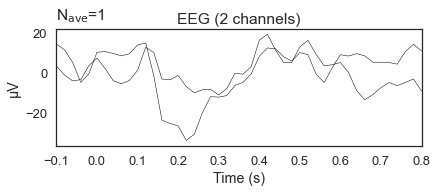

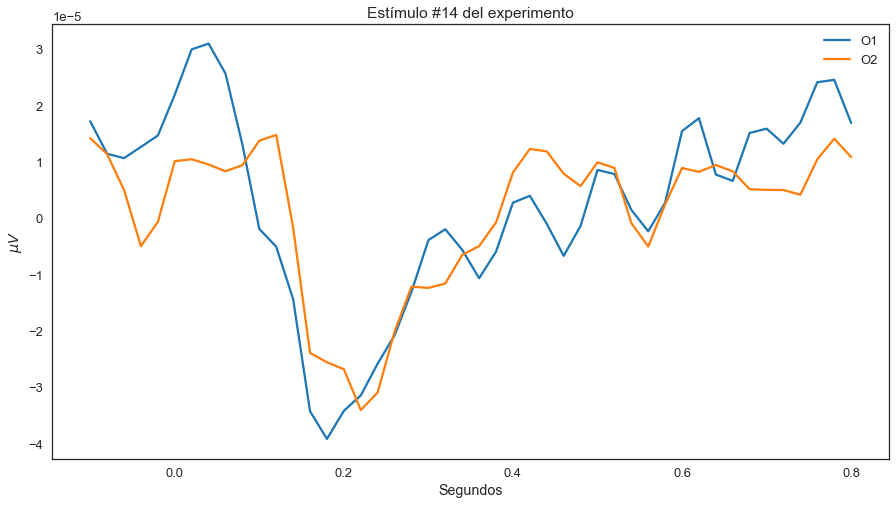

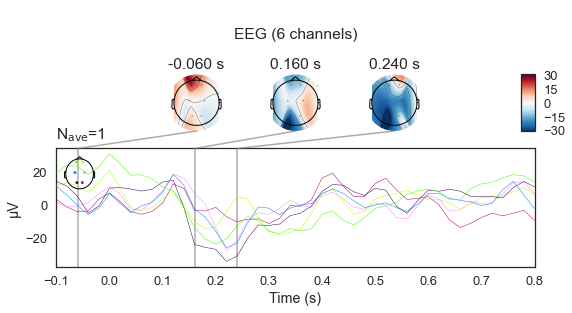

Fragmento de la señal CON ruido | Noise Order = 3.8 | Noise por canal: 2.523829377920772e-10 |


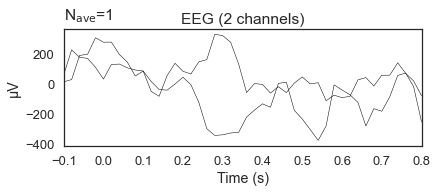

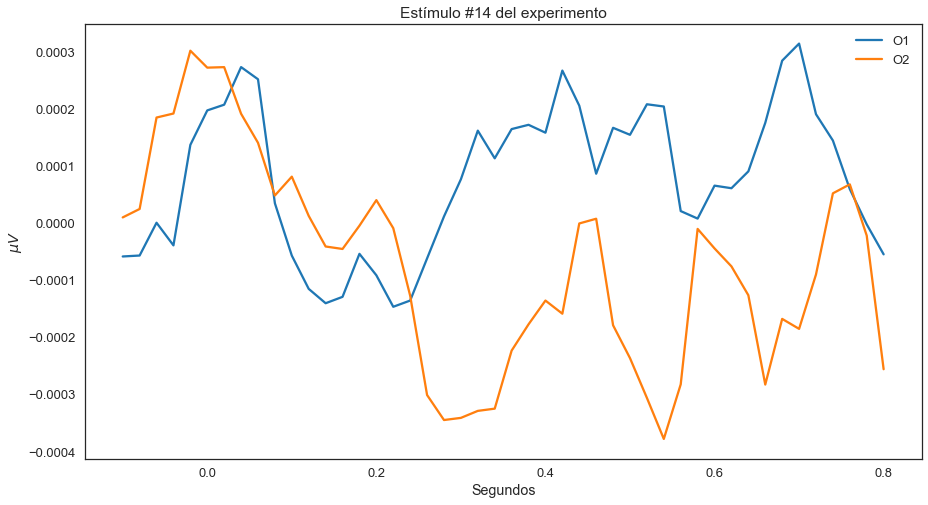

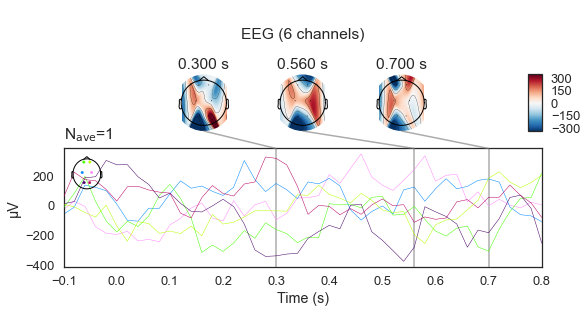

Comienzo del proceso de clasificación del experimento:  20-07-2020, 18:02:28 (GMT+1)
[Vect + LR] Puntuación = 0.5652173913043479/1
[Vect + RegLDA] Puntuación = 0.5304347826086956/1
[Xdawn + RegLDA] Puntuación = 0.42608695652173906/1
[ERPCov + TS] Puntuación = 0.1956521739130435/1
[ERPCov + MDM] Puntuación = 0.26521739130434785/1
Fin del proceso de clasificación del experimento:  20-07-2020, 18:02:30 (GMT+1)


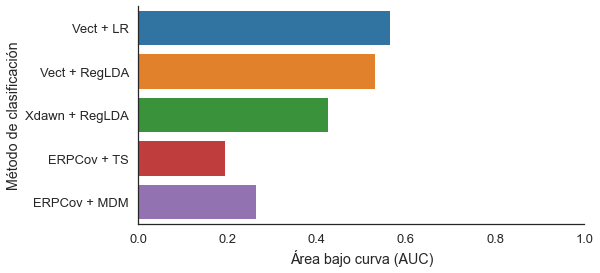

In [63]:
epochs_noise = epochs.copy()
cov = mne.make_ad_hoc_cov(epochs_noise.info)
rng = np.random.RandomState(0)

print(cov)

# cov['data'] tiene el ruido de cada canal
# podemos añadir ruido a todos los canales con fill
order_noise = 3.8
one_channel = cov['data'][0] # igual para todos por defecto, cogemos el primero
print(one_channel)
cov['data'].fill(one_channel * pow(10, order_noise))
one_channel_new = cov['data'][0]

print(cov)

epochs_noise_apply = mne.simulation.add_noise(epochs_noise, cov, iir_filter=[0.2, -0.2, 0.04], random_state=rng, verbose='ERROR')



# ax1.plot(times_ini, data_ini.T);
# ax1.set_title('Raw data original')
# ax1.set_xlabel('Segundos')
# ax1.set_ylabel('$\mu V$')

# ax2.plot(times_f, data_f.T);
# ax2.set_title('Raw data filtrado')
# ax2.set_xlabel('Segundos')

# plt.legend(raw.ch_names[:8], loc=1);
# plt.tight_layout()

data_example = {}

print("Fragmento de la señal SIN ruido (mismas gráficas que las mostradas anteriormente) | Noise por canal: {}".format(one_channel))
for ii, ev in enumerate(epochs.iter_evoked(True)):
    if ev.comment == '1':
        if ii == 14:
#             plot_all_evoked()
            plot_occipital_evoked()

            
            data_example['0'] = [ev.times, ev.data[-3:-1].T]
    
            #fig = ev.plot_topomap(times=np.linspace(0.00, 0.1, 10), ch_type='eeg', colorbar=True)
            #ev.plot(picks='eeg', spatial_colors=True)

print("Fragmento de la señal CON ruido | Noise Order = {} | Noise por canal: {} |".format(order_noise, one_channel_new))
for ii, ev in enumerate(epochs_noise_apply.iter_evoked(True)):
    if ev.comment == '1':
        if ii == 14:
#             plot_all_evoked()
            plot_occipital_evoked()
            
            data_example['1'] = [ev.times, ev.data[-3:-1].T]
            #fig = ev.plot_topomap(times=np.linspace(0.00, 0.1, 10), ch_type='eeg', colorbar=True)
            #ev.plot(picks='eeg', spatial_colors=True)

ejecutar_clasificador(epochs_noise_apply)
# print(data_example)
# fig, (ax1, ax2) = plt.subplots(1,2, figsize = (40, 10))

# ax1.plot(data_example['0'][0], data_example['0'][1])
# ax1.set_xlabel('Segundos')
# ax1.set_ylabel('$\mu V$')
# ax1.set_title('abc')

# ax1.plot(data_example['1'][0], data_example['1'][0])
# ax1.set_xlabel('Segundos')
# ax1.set_ylabel('$\mu V$')
# ax1.set_title('def')      
# plt.legend(raw.ch_names[-3:-1], loc=1);            


In [64]:
epochs.info

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, C3, C4, P7, P8, O1, O2
 chs: 8 EEG
 custom_ref_applied: False
 dig: 11 items (3 Cardinal, 8 EEG)
 highpass: 1.0 Hz
 lowpass: 17.0 Hz
 meas_date: unspecified
 nchan: 8
 projs: []
 sfreq: 50.0 Hz
>

In [65]:
raw_notch_and_filter_downsamp.info

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, C3, C4, P7, P8, O1, O2, Stim
 chs: 8 EEG, 1 STIM
 custom_ref_applied: False
 dig: 11 items (3 Cardinal, 8 EEG)
 highpass: 1.0 Hz
 lowpass: 17.0 Hz
 meas_date: unspecified
 nchan: 9
 projs: []
 sfreq: 50.0 Hz
>